In [45]:
import jax.numpy as np 
import jax

import matplotlib.pyplot as plt 
from inrmri.image_processor import reduce_FOV
from inrmri.basic_plotting import full_halph_FOV_space_time
from misc_nnx import downsample_sinc_image, radial_mask, exponential_kspace_weight

from inrmri.radial_acquisitions import RadialAcquisitions


folder = '/home/egcuevaj/repositories/SR-ST-DIP-cMRI/data/Josefa-CineLR/'

In [46]:
# ------------------------------------------------------- # 
# Cargar los datos disponibles 
# ------------------------------------------------------- # 
print("Loading data...")

data = np.load(folder + 'sl5-data.npy')
trajs = np.load(folder + 'sl5-traj.npy')
radial_acquisition = RadialAcquisitions(trajs, data)

csmap = np.load(folder + 'sl5-csmap.npy')

# Reconstrucción con iterative sense (la reco más básica cuando se conocen las bobinas)
reco_sense = np.load(folder + 'sl5-reco-sense.npy') 

# Reconstrucción con GRASP (una reco que además de las bobinas incluye regularización (TV en tiempo))
reco_grasp = np.load(folder + 'sl5-reco-grasp.npy') 

print("Data loaded!")
print(radial_acquisition)
print(f"csmap has shape {csmap.shape}: {csmap.shape[0]} sensitivity maps of size {csmap.shape[1:3]}")
print(f"reco_sense has shape: {reco_sense.shape}: {reco_sense.shape[-1]} frames of size {reco_sense.shape[:2]}")
print(f"reco_grasp has shape: {reco_grasp.shape}: {reco_grasp.shape[-1]} frames of size {reco_grasp.shape[:2]}")

Loading data...
Data loaded!
Radial adquisition: 28 coils, 31 frames of 15 spokes each, 256 samples per spokes.
csmap has shape (28, 256, 256): 28 sensitivity maps of size (256, 256)
reco_sense has shape: (256, 256, 31): 31 frames of size (256, 256)
reco_grasp has shape: (256, 256, 31): 31 frames of size (256, 256)


Usaremos un solo frame, por ejemplo el octavo.

In [47]:
frame = 8
N = 128
x_temp = reco_grasp[:, :, frame]

c = 256 // 2
h = N // 2
x_true = x_temp[c - h : c + h, c - h : c + h]

In [48]:
# Super-resolution factor
s = 2
N_LR = N // s

x_lr_true, k_lr_true = downsample_sinc_image(x_true, s)

In [49]:
x_lr_true.shape

(1, 64, 64)

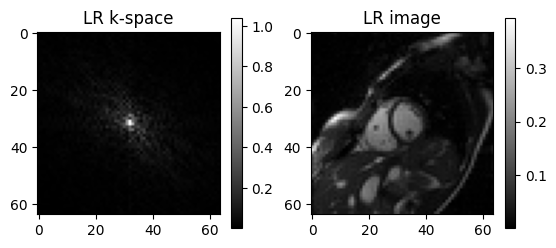

In [50]:
plt.figure(figsize=(10, 6))

plt.subplot(2, 3, 1)
plt.imshow(np.log1p(np.abs(k_lr_true)), cmap='gray')
plt.title("LR k-space")
plt.colorbar()

plt.subplot(2, 3, 2)
plt.imshow(np.abs(x_lr_true[0,:, :]), cmap='gray')
plt.title("LR image")
plt.colorbar()


In [51]:
# ===============================================================
# 4. Noise inputs (fixed)
# ===============================================================
key = jax.random.key(0)
z_hr = jax.random.normal(key, (1, N, N, 1)) 
z_lr, _ = downsample_sinc_image(z_hr, s=2)
z_lr = z_lr[..., None]

mask_radial = radial_mask(N, n_spokes=80, radius_ratio=1.0)
mask_radial_LR = np.ones((N_LR,N_LR))
# mask_radial_LR = radial_mask(N_LR, n_spokes=80, radius_ratio=0.5)
W_exp = exponential_kspace_weight(N_LR, c=0.8)

In [52]:
from misc_nnx import charbonnier_loss, weighted_complex_mse
from misc_nnx import apply_radial_mask_image, fft2c
# from objax.functional import tv

x_lr_true = 10 * x_lr_true

def tv(I, eps=1e-6, normalize=True):
    """
    Total Variation (isotrópica) para imagen 2D COMPLEJA.
    I: (H, W) complejo
    """
    # Diferencias hacia adelante
    dx = I[:, 1:] - I[:, :-1]   # (H, W-1)
    dy = I[1:, :] - I[:-1, :]   # (H-1, W)

    # Recortar a la intersección común (H-1, W-1)
    dx = dx[:-1, :]             # (H-1, W-1)
    dy = dy[:, :-1]             # (H-1, W-1)

    # Norma del gradiente complejo: |z|^2 = (Re z)^2 + (Im z)^2
    g2 = np.abs(dx)**2 + np.abs(dy)**2
    tv = np.sum(np.sqrt(g2 + eps))

    if normalize:
        tv = tv / (I.shape[0] * I.shape[1])
    return tv


def loss_fn(model, beta=0.001, lambda_tv=1e-2):

    # === Forward predictions ===
    y = model(z_hr, training=True) # (1, N, N, 2)
    I_hr_pred = y[..., 0] + 1j * y[..., 1] # (1, N, N)
    k_lr_pred = apply_radial_mask_image(I_hr_pred, mask_radial_LR) # (n,n) LR

    y_lr = model(z_lr, training=True) # (1, n, n, 2)
    I_lr2_pred = y_lr[..., 0] + 1j * y_lr[..., 1] # (1, n, n)
    k_lr2_pred = fft2c(I_lr2_pred[0, :, :]) * mask_radial_LR   # (n,n) both

    # === Losses ===
    # Unsupervised branch (consistency between predicted HR→masked LR and true LR)
    I_lr_pred,_ = downsample_sinc_image(I_hr_pred[0, :, :], s=2) #(1,N,N)
    L_img1 = charbonnier_loss(I_lr_pred, x_lr_true)
    L_data1 = weighted_complex_mse(
        k_lr_pred * mask_radial_LR,
        k_lr_true * mask_radial_LR,
        W_exp
    )
    L_US = L_img1 + L_data1

    # Supervised branch (direct LR prediction consistency)
    L_img2 = charbonnier_loss(I_lr2_pred, x_lr_true)
    L_data2 = weighted_complex_mse(
        k_lr2_pred * mask_radial_LR,
        k_lr_true * mask_radial_LR,
        W_exp
    )
    L_SS = beta * (L_img2 + L_data2)
    # === TV regularization on HR image ===
    L_TV = lambda_tv * tv(I_hr_pred[0, :, :]) # isotropic TV, JAX-compatible

    # === Total loss ===
    return L_US + L_SS + L_TV




In [53]:
# ===============================================================
# 3. Shared decoder network
# ===============================================================
# from misc_nnx import DecoderNNX  # the one we fixed before
from misc_nnx import UNetDIP
from flax import nnx
import optax

key = jax.random.key(0)
model = UNetDIP(in_channels=1, out_channels=2, features=(32,64,128,256), rngs=nnx.Rngs(key))
# model = UNetDIP(in_channels=1, out_channels=2, features=(16,32,64,128), rngs=nnx.Rngs(key))


In [54]:
# ===============================================================
# 6. Optimizer
# ===============================================================
optimizer = nnx.Optimizer(
    model=model,
    tx=optax.adam(1e-3),
    wrt=nnx.Param
)

Step     0, Loss: 7.7386e-01


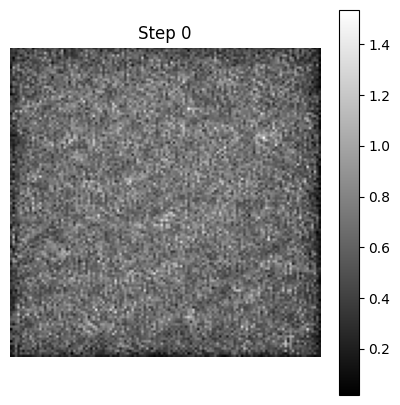

Step    10, Loss: 6.1515e-01
Step    20, Loss: 5.8958e-01
Step    30, Loss: 5.7413e-01
Step    40, Loss: 5.6593e-01
Step    50, Loss: 5.4414e-01


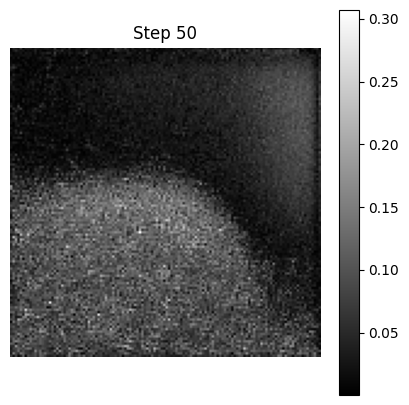

Step    60, Loss: 5.3410e-01
Step    70, Loss: 5.2018e-01
Step    80, Loss: 5.0660e-01
Step    90, Loss: 4.9668e-01
Step   100, Loss: 5.0167e-01


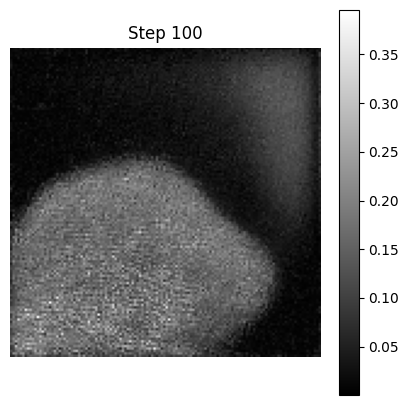

Step   110, Loss: 4.8901e-01
Step   120, Loss: 4.8538e-01
Step   130, Loss: 4.7755e-01
Step   140, Loss: 4.7509e-01
Step   150, Loss: 4.7914e-01


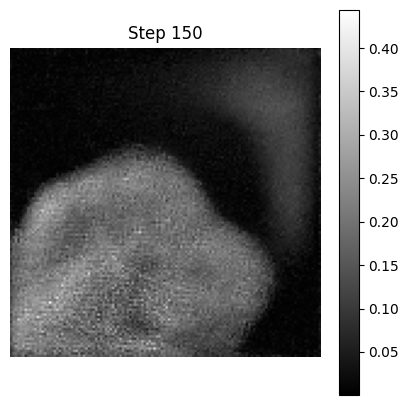

Step   160, Loss: 4.7162e-01
Step   170, Loss: 4.6916e-01
Step   180, Loss: 4.7095e-01
Step   190, Loss: 4.6384e-01
Step   200, Loss: 4.6380e-01


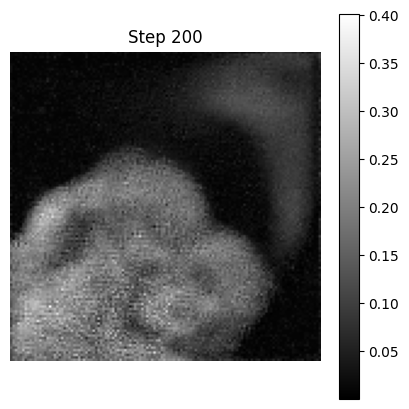

Step   210, Loss: 4.6271e-01
Step   220, Loss: 4.7028e-01
Step   230, Loss: 4.6123e-01
Step   240, Loss: 4.5938e-01
Step   250, Loss: 4.6356e-01


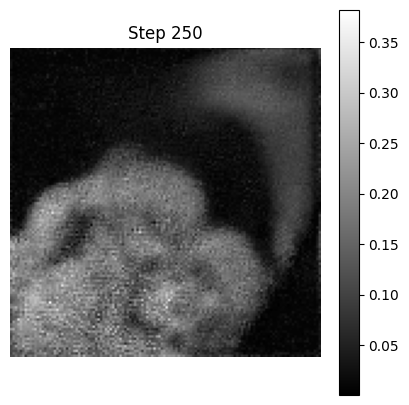

Step   260, Loss: 4.6128e-01
Step   270, Loss: 4.5348e-01
Step   280, Loss: 4.5281e-01
Step   290, Loss: 4.4934e-01
Step   300, Loss: 4.4936e-01


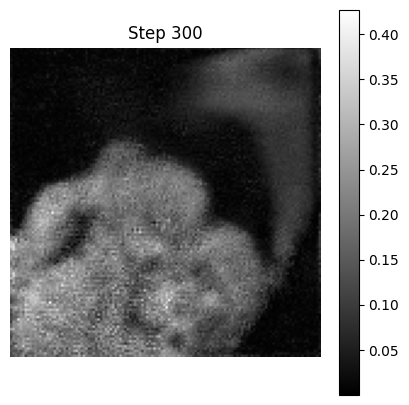

Step   310, Loss: 4.6203e-01
Step   320, Loss: 4.4716e-01
Step   330, Loss: 4.5110e-01
Step   340, Loss: 4.4795e-01
Step   350, Loss: 4.5049e-01


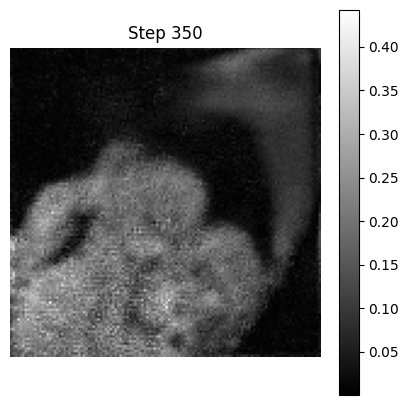

Step   360, Loss: 4.4309e-01
Step   370, Loss: 4.4392e-01
Step   380, Loss: 4.4018e-01
Step   390, Loss: 4.4258e-01
Step   400, Loss: 4.4978e-01


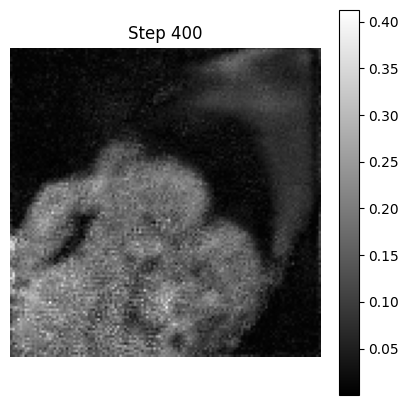

Step   410, Loss: 4.4038e-01
Step   420, Loss: 4.3839e-01
Step   430, Loss: 4.4291e-01
Step   440, Loss: 4.3827e-01
Step   450, Loss: 4.4161e-01


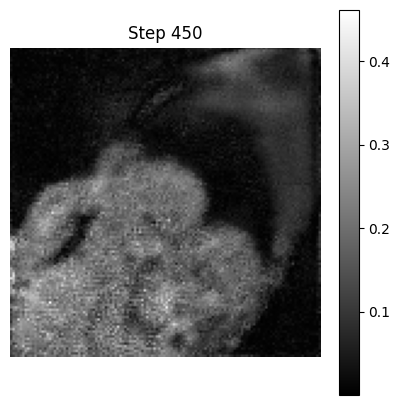

Step   460, Loss: 4.3402e-01
Step   470, Loss: 4.4151e-01
Step   480, Loss: 4.4303e-01
Step   490, Loss: 4.3794e-01
Step   500, Loss: 4.3016e-01


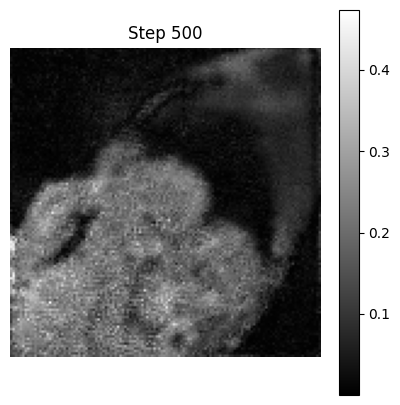

Step   510, Loss: 4.2978e-01
Step   520, Loss: 4.2965e-01
Step   530, Loss: 4.2556e-01
Step   540, Loss: 4.2858e-01
Step   550, Loss: 4.3480e-01


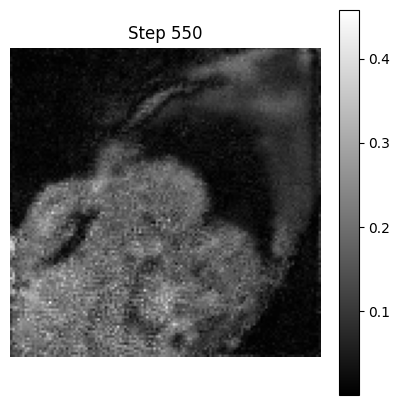

Step   560, Loss: 4.3028e-01
Step   570, Loss: 4.2037e-01
Step   580, Loss: 4.3405e-01
Step   590, Loss: 4.1725e-01
Step   600, Loss: 4.2054e-01


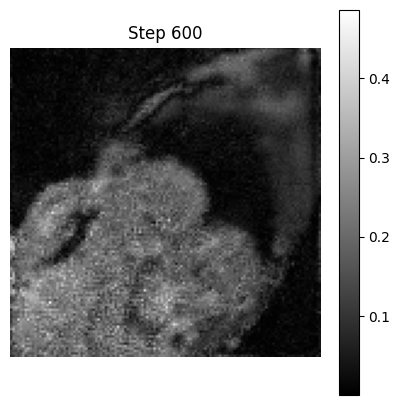

Step   610, Loss: 4.3012e-01
Step   620, Loss: 4.2023e-01
Step   630, Loss: 4.1764e-01
Step   640, Loss: 4.1907e-01
Step   650, Loss: 4.2456e-01


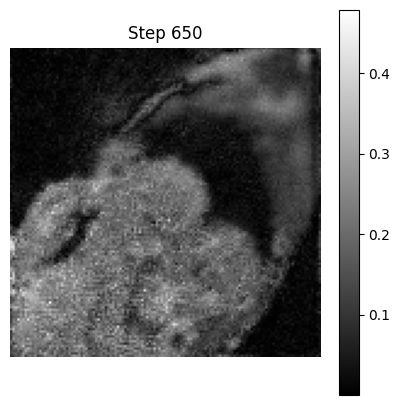

Step   660, Loss: 4.2140e-01
Step   670, Loss: 4.1593e-01
Step   680, Loss: 4.1601e-01
Step   690, Loss: 4.1391e-01
Step   700, Loss: 4.1082e-01


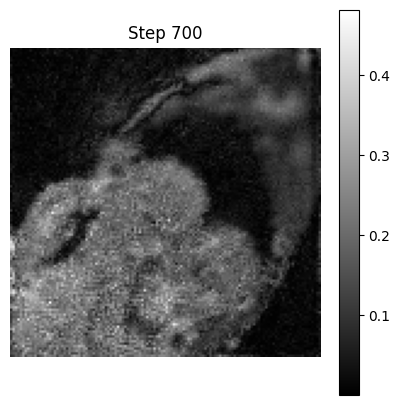

Step   710, Loss: 4.0987e-01
Step   720, Loss: 4.2221e-01
Step   730, Loss: 4.0823e-01
Step   740, Loss: 4.1138e-01
Step   750, Loss: 4.0700e-01


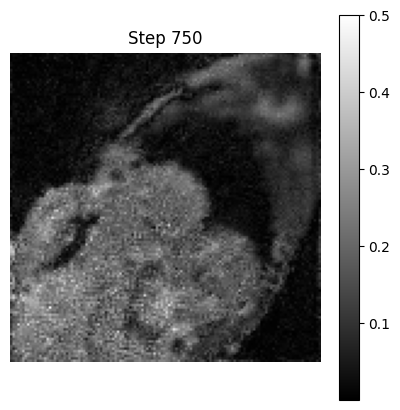

Step   760, Loss: 4.0148e-01
Step   770, Loss: 4.0083e-01
Step   780, Loss: 4.1493e-01
Step   790, Loss: 4.0303e-01
Step   800, Loss: 4.0989e-01


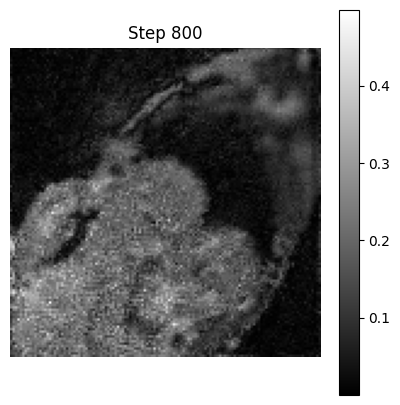

Step   810, Loss: 3.9933e-01
Step   820, Loss: 3.9832e-01
Step   830, Loss: 3.9663e-01
Step   840, Loss: 4.0524e-01
Step   850, Loss: 3.9424e-01


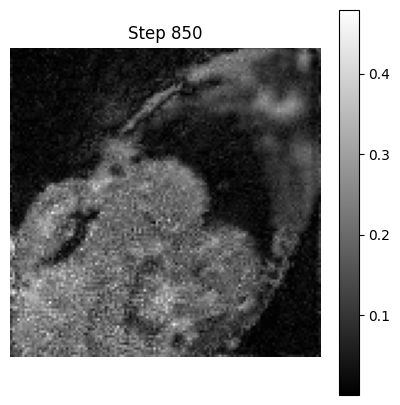

Step   860, Loss: 3.9495e-01
Step   870, Loss: 3.9651e-01
Step   880, Loss: 3.9371e-01
Step   890, Loss: 4.0334e-01
Step   900, Loss: 4.0212e-01


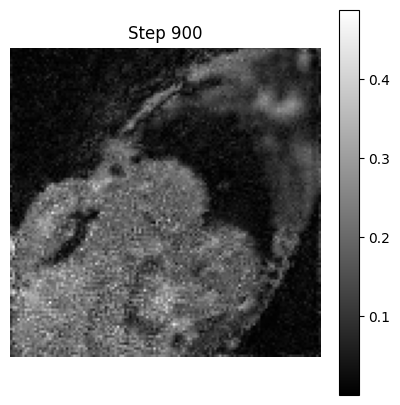

Step   910, Loss: 3.9269e-01
Step   920, Loss: 3.9253e-01
Step   930, Loss: 3.9441e-01
Step   940, Loss: 3.8693e-01
Step   950, Loss: 3.9970e-01


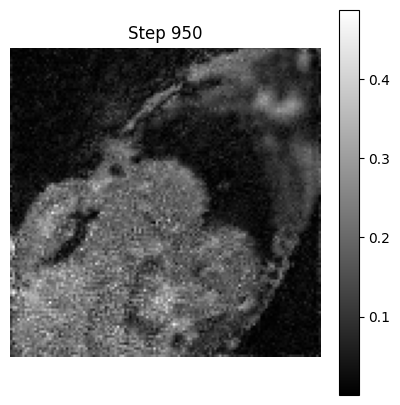

Step   960, Loss: 3.8762e-01
Step   970, Loss: 3.9510e-01
Step   980, Loss: 3.8435e-01
Step   990, Loss: 3.8382e-01
Step  1000, Loss: 3.8852e-01


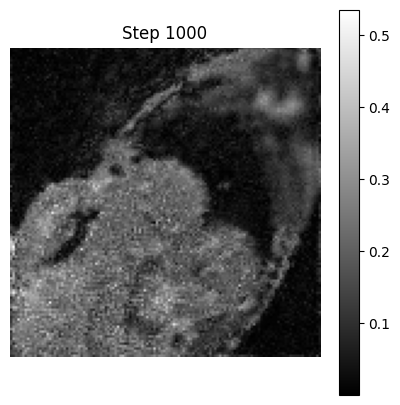

Step  1010, Loss: 3.9001e-01
Step  1020, Loss: 3.9885e-01
Step  1030, Loss: 3.8624e-01
Step  1040, Loss: 3.9251e-01
Step  1050, Loss: 3.8357e-01


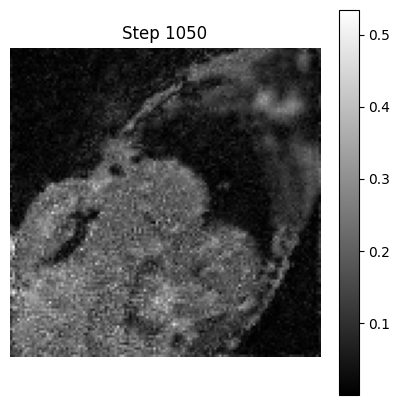

Step  1060, Loss: 3.8222e-01
Step  1070, Loss: 3.8503e-01
Step  1080, Loss: 3.8933e-01
Step  1090, Loss: 3.8826e-01
Step  1100, Loss: 3.8092e-01


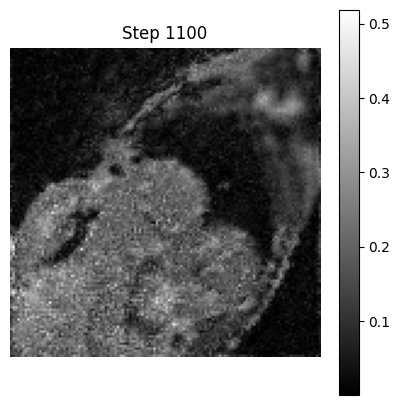

Step  1110, Loss: 3.8112e-01
Step  1120, Loss: 3.8077e-01
Step  1130, Loss: 3.7924e-01
Step  1140, Loss: 3.8692e-01
Step  1150, Loss: 3.7983e-01


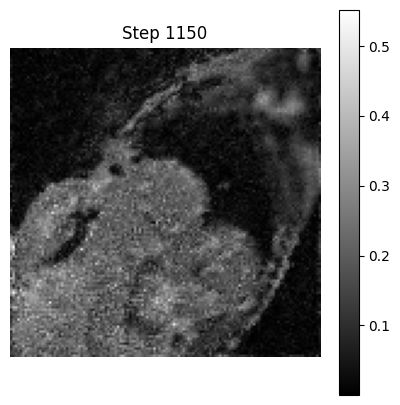

Step  1160, Loss: 3.8217e-01
Step  1170, Loss: 3.7640e-01
Step  1180, Loss: 3.7815e-01
Step  1190, Loss: 3.6490e-01
Step  1200, Loss: 3.7463e-01


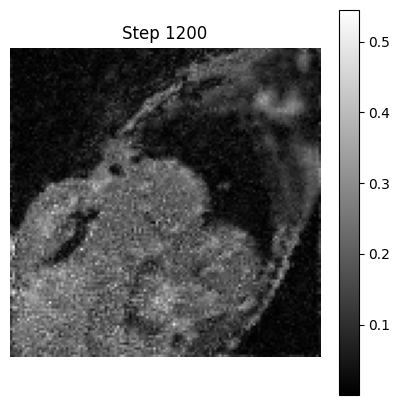

Step  1210, Loss: 3.9486e-01
Step  1220, Loss: 3.8424e-01
Step  1230, Loss: 3.7522e-01
Step  1240, Loss: 3.7252e-01
Step  1250, Loss: 3.7746e-01


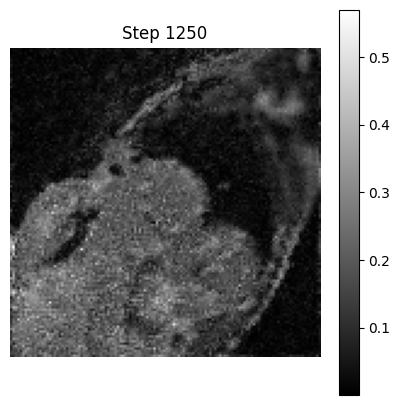

Step  1260, Loss: 3.7599e-01
Step  1270, Loss: 3.7118e-01
Step  1280, Loss: 3.7508e-01
Step  1290, Loss: 3.7431e-01
Step  1300, Loss: 3.6585e-01


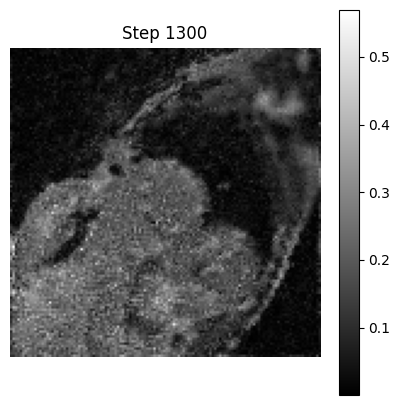

Step  1310, Loss: 3.7271e-01
Step  1320, Loss: 3.7685e-01
Step  1330, Loss: 3.6772e-01
Step  1340, Loss: 3.7809e-01
Step  1350, Loss: 3.8319e-01


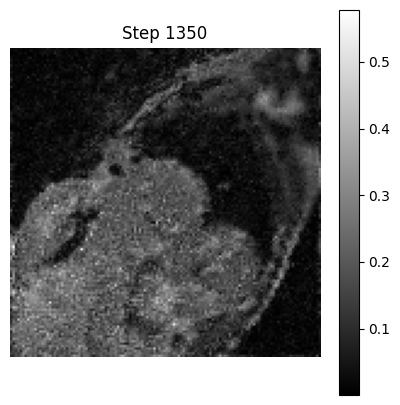

Step  1360, Loss: 3.7194e-01
Step  1370, Loss: 3.6813e-01
Step  1380, Loss: 3.6493e-01
Step  1390, Loss: 3.5896e-01
Step  1400, Loss: 3.7115e-01


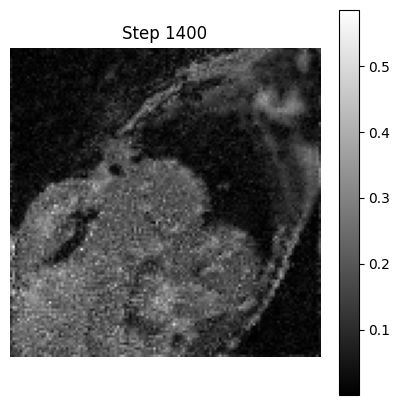

Step  1410, Loss: 3.6481e-01
Step  1420, Loss: 3.6584e-01
Step  1430, Loss: 3.7222e-01
Step  1440, Loss: 3.6291e-01
Step  1450, Loss: 3.6490e-01


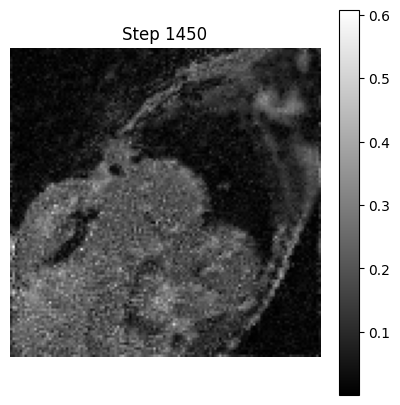

Step  1460, Loss: 3.9430e-01
Step  1470, Loss: 3.7337e-01
Step  1480, Loss: 3.5764e-01
Step  1490, Loss: 3.6761e-01
Step  1500, Loss: 3.6260e-01


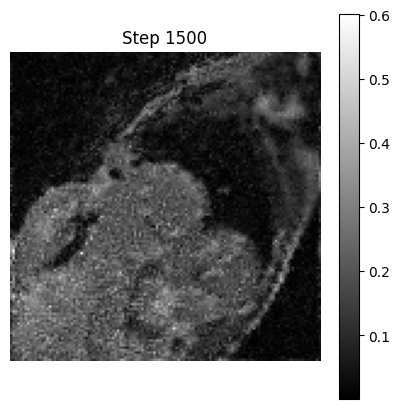

Step  1510, Loss: 3.6861e-01
Step  1520, Loss: 3.6034e-01
Step  1530, Loss: 3.6217e-01
Step  1540, Loss: 3.6335e-01
Step  1550, Loss: 3.6199e-01


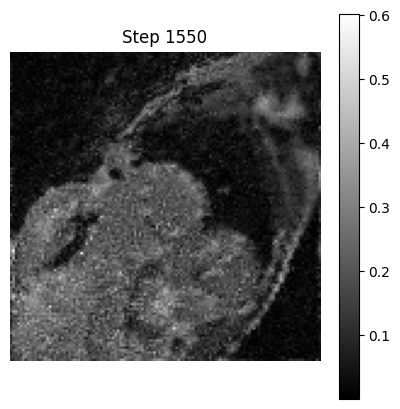

Step  1560, Loss: 3.6854e-01
Step  1570, Loss: 3.6668e-01
Step  1580, Loss: 3.5026e-01
Step  1590, Loss: 3.5596e-01
Step  1600, Loss: 3.8045e-01


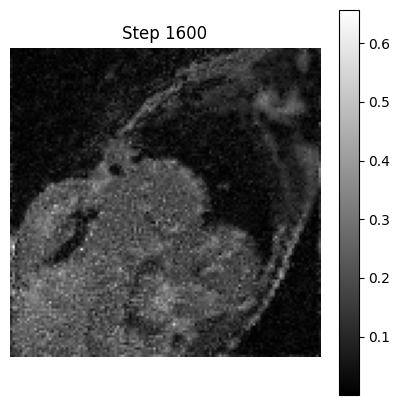

Step  1610, Loss: 3.5899e-01
Step  1620, Loss: 3.7053e-01
Step  1630, Loss: 3.6757e-01
Step  1640, Loss: 3.6082e-01
Step  1650, Loss: 3.5717e-01


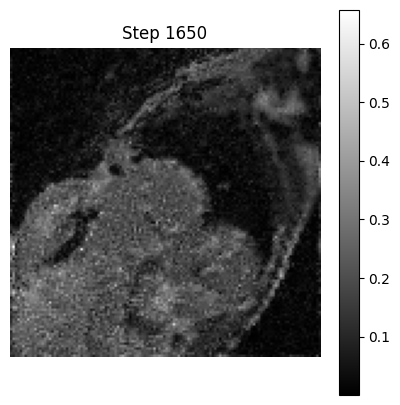

Step  1660, Loss: 3.5980e-01
Step  1670, Loss: 3.5987e-01
Step  1680, Loss: 3.5287e-01
Step  1690, Loss: 3.5295e-01
Step  1700, Loss: 3.4887e-01


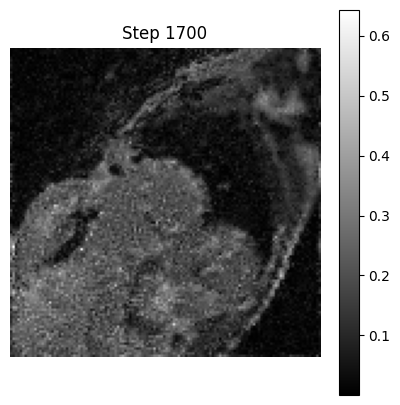

Step  1710, Loss: 3.5491e-01
Step  1720, Loss: 3.7121e-01
Step  1730, Loss: 3.4847e-01
Step  1740, Loss: 3.4352e-01
Step  1750, Loss: 3.4984e-01


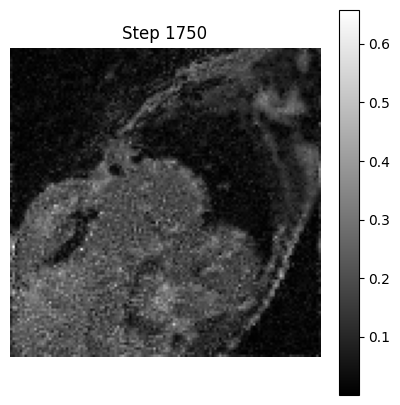

Step  1760, Loss: 3.4598e-01
Step  1770, Loss: 3.4871e-01
Step  1780, Loss: 3.6997e-01
Step  1790, Loss: 3.5453e-01
Step  1800, Loss: 3.4833e-01


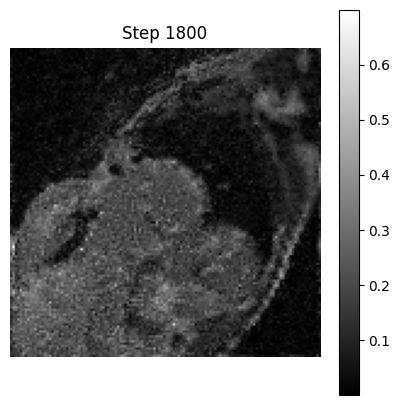

Step  1810, Loss: 3.4529e-01
Step  1820, Loss: 3.5163e-01
Step  1830, Loss: 3.6245e-01
Step  1840, Loss: 3.4867e-01
Step  1850, Loss: 3.5790e-01


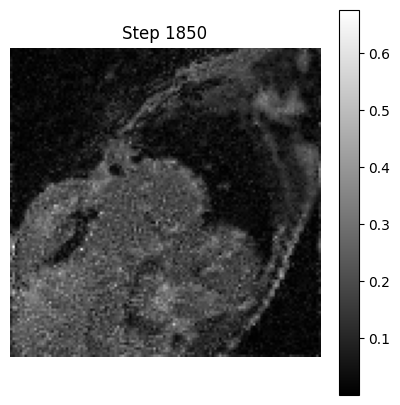

Step  1860, Loss: 3.5900e-01
Step  1870, Loss: 3.5983e-01
Step  1880, Loss: 3.4510e-01
Step  1890, Loss: 3.4500e-01
Step  1900, Loss: 3.5425e-01


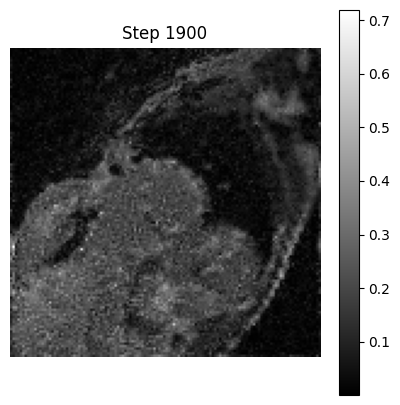

Step  1910, Loss: 3.5778e-01
Step  1920, Loss: 3.4903e-01
Step  1930, Loss: 3.4285e-01
Step  1940, Loss: 3.5628e-01
Step  1950, Loss: 3.4747e-01


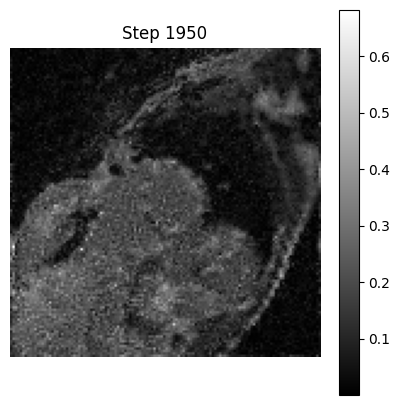

Step  1960, Loss: 3.4348e-01
Step  1970, Loss: 3.4799e-01
Step  1980, Loss: 3.5225e-01
Step  1990, Loss: 3.4566e-01
Step  2000, Loss: 3.6288e-01


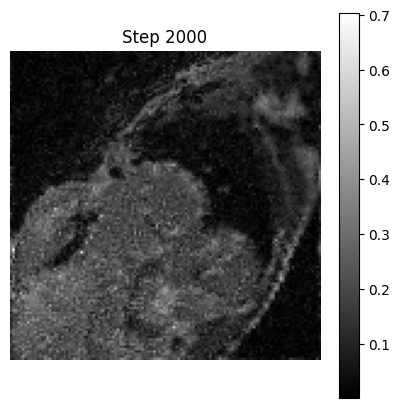

Step  2010, Loss: 3.5977e-01
Step  2020, Loss: 3.4659e-01
Step  2030, Loss: 3.6432e-01
Step  2040, Loss: 3.4596e-01
Step  2050, Loss: 3.5052e-01


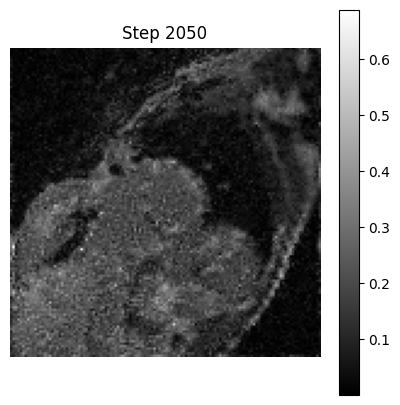

Step  2060, Loss: 3.5904e-01
Step  2070, Loss: 3.4780e-01
Step  2080, Loss: 3.4946e-01
Step  2090, Loss: 3.4114e-01
Step  2100, Loss: 3.4944e-01


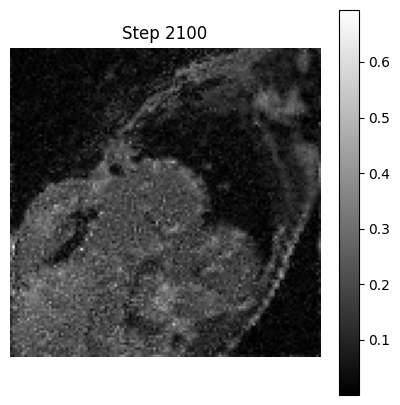

Step  2110, Loss: 3.4123e-01
Step  2120, Loss: 3.4077e-01
Step  2130, Loss: 3.3835e-01
Step  2140, Loss: 3.4197e-01
Step  2150, Loss: 3.4179e-01


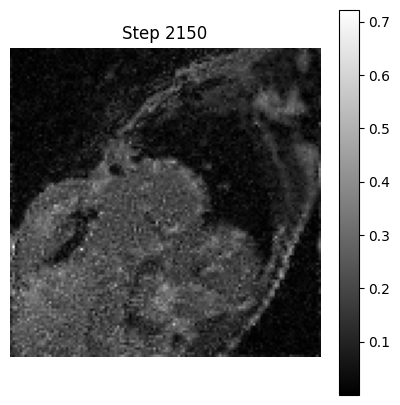

Step  2160, Loss: 3.5140e-01
Step  2170, Loss: 3.4674e-01
Step  2180, Loss: 3.4420e-01
Step  2190, Loss: 3.3958e-01
Step  2200, Loss: 3.4713e-01


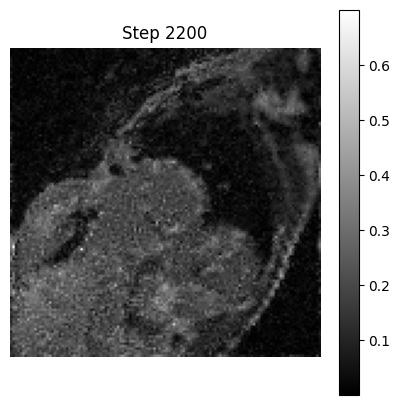

Step  2210, Loss: 3.5295e-01
Step  2220, Loss: 3.3931e-01
Step  2230, Loss: 3.4621e-01
Step  2240, Loss: 3.4433e-01
Step  2250, Loss: 3.4371e-01


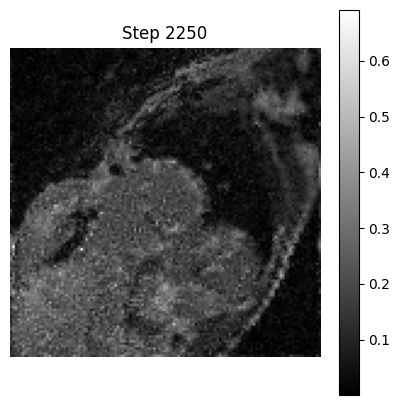

Step  2260, Loss: 3.4955e-01
Step  2270, Loss: 3.4547e-01
Step  2280, Loss: 3.5333e-01
Step  2290, Loss: 3.6051e-01
Step  2300, Loss: 3.4570e-01


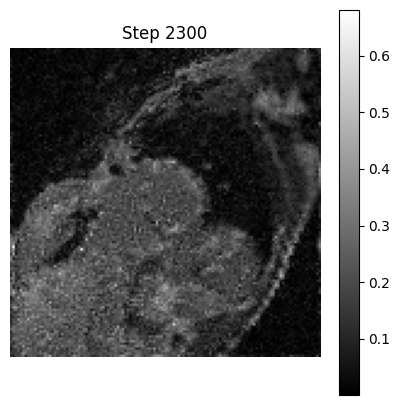

Step  2310, Loss: 3.3764e-01
Step  2320, Loss: 3.4394e-01
Step  2330, Loss: 3.4477e-01
Step  2340, Loss: 3.4327e-01
Step  2350, Loss: 3.3904e-01


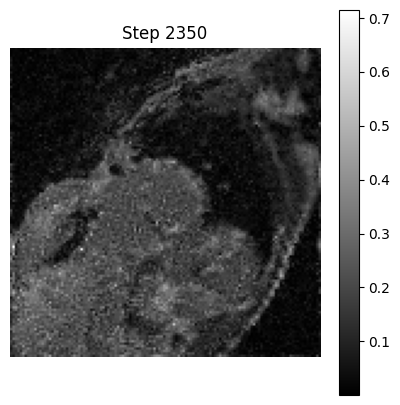

Step  2360, Loss: 3.4603e-01
Step  2370, Loss: 3.3547e-01
Step  2380, Loss: 3.4167e-01
Step  2390, Loss: 3.4294e-01
Step  2400, Loss: 3.3708e-01


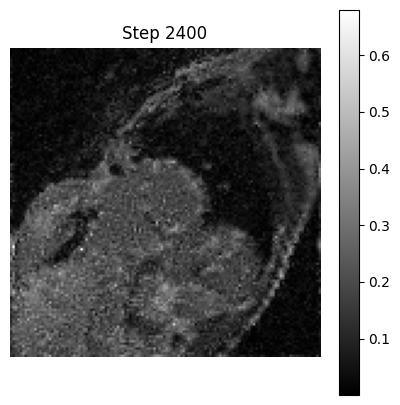

Step  2410, Loss: 3.4857e-01
Step  2420, Loss: 3.5384e-01
Step  2430, Loss: 3.4035e-01
Step  2440, Loss: 3.3808e-01
Step  2450, Loss: 3.4272e-01


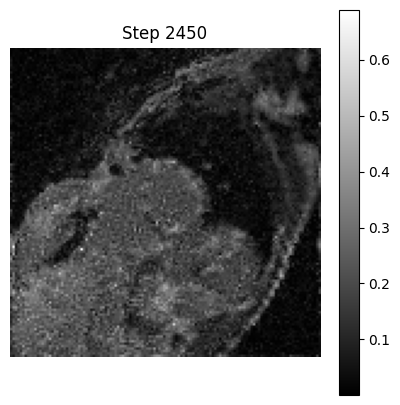

Step  2460, Loss: 3.4851e-01
Step  2470, Loss: 3.3292e-01
Step  2480, Loss: 3.4224e-01
Step  2490, Loss: 3.3690e-01
Step  2500, Loss: 3.3574e-01


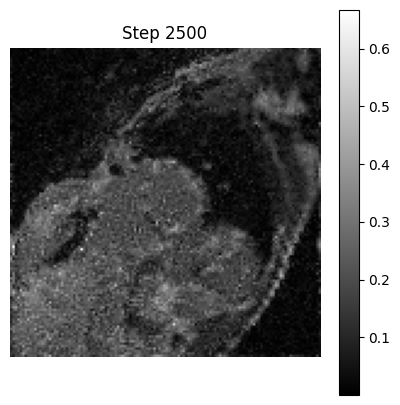

Step  2510, Loss: 3.3615e-01
Step  2520, Loss: 3.4263e-01
Step  2530, Loss: 3.4129e-01
Step  2540, Loss: 3.3954e-01
Step  2550, Loss: 3.3556e-01


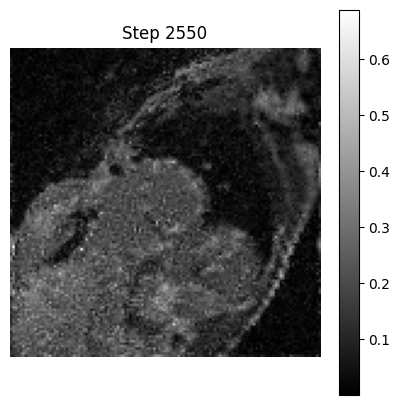

Step  2560, Loss: 3.3056e-01
Step  2570, Loss: 3.4106e-01
Step  2580, Loss: 3.3951e-01
Step  2590, Loss: 3.3969e-01
Step  2600, Loss: 3.4028e-01


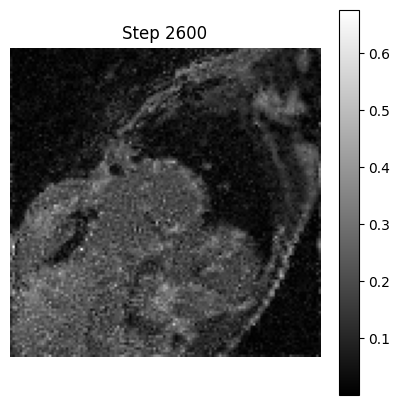

Step  2610, Loss: 3.3865e-01
Step  2620, Loss: 3.3649e-01
Step  2630, Loss: 3.3502e-01
Step  2640, Loss: 3.5221e-01
Step  2650, Loss: 3.2801e-01


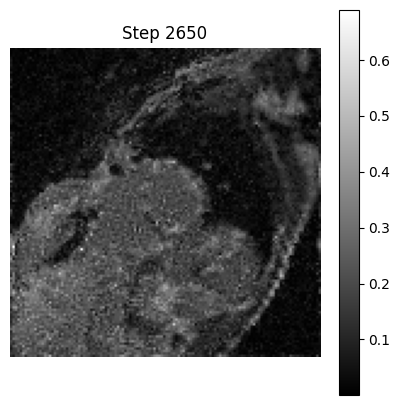

Step  2660, Loss: 3.3299e-01
Step  2670, Loss: 3.3187e-01
Step  2680, Loss: 3.2788e-01
Step  2690, Loss: 3.3410e-01
Step  2700, Loss: 3.3447e-01


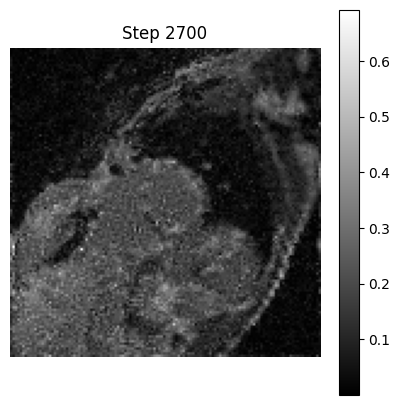

Step  2710, Loss: 3.4341e-01
Step  2720, Loss: 3.4570e-01
Step  2730, Loss: 3.2896e-01
Step  2740, Loss: 3.3145e-01
Step  2750, Loss: 3.3269e-01


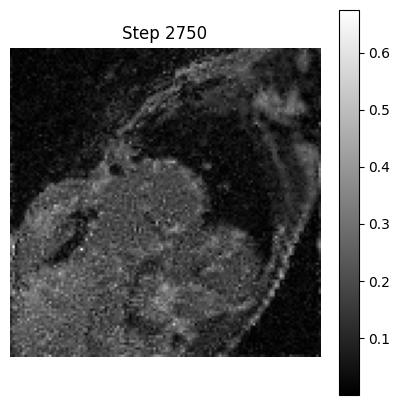

Step  2760, Loss: 3.3018e-01
Step  2770, Loss: 3.3938e-01
Step  2780, Loss: 3.5618e-01
Step  2790, Loss: 3.3156e-01
Step  2800, Loss: 3.3513e-01


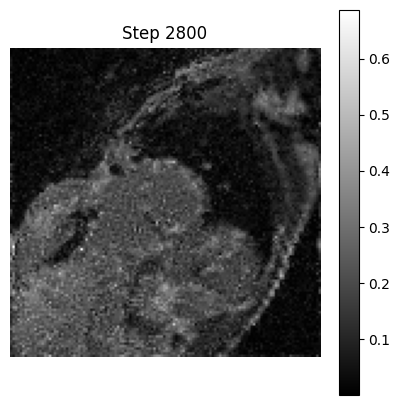

Step  2810, Loss: 3.3768e-01
Step  2820, Loss: 3.3579e-01
Step  2830, Loss: 3.3522e-01
Step  2840, Loss: 3.3256e-01
Step  2850, Loss: 3.3244e-01


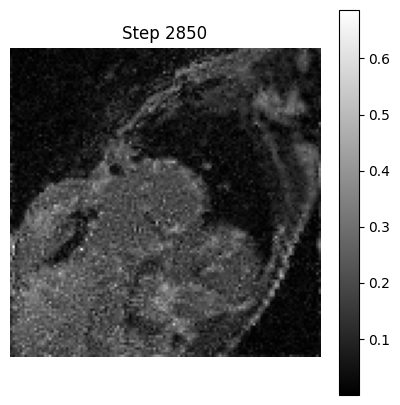

Step  2860, Loss: 3.3022e-01
Step  2870, Loss: 3.3842e-01
Step  2880, Loss: 3.3440e-01
Step  2890, Loss: 3.3634e-01
Step  2900, Loss: 3.3629e-01


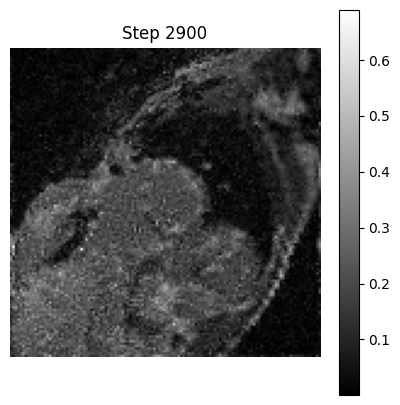

Step  2910, Loss: 3.2933e-01
Step  2920, Loss: 3.2364e-01
Step  2930, Loss: 3.4078e-01
Step  2940, Loss: 3.3402e-01
Step  2950, Loss: 3.4677e-01


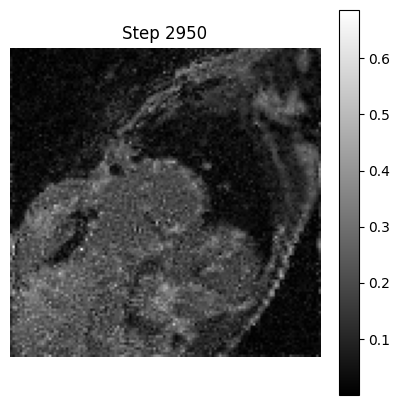

Step  2960, Loss: 3.4286e-01
Step  2970, Loss: 3.3416e-01
Step  2980, Loss: 3.4377e-01
Step  2990, Loss: 3.3990e-01
Step  3000, Loss: 3.2930e-01


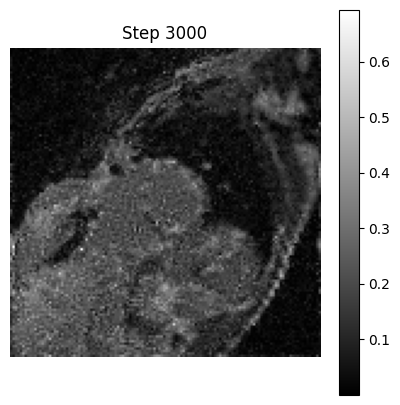

Step  3010, Loss: 3.3101e-01
Step  3020, Loss: 3.2634e-01
Step  3030, Loss: 3.2989e-01
Step  3040, Loss: 3.4032e-01
Step  3050, Loss: 3.3404e-01


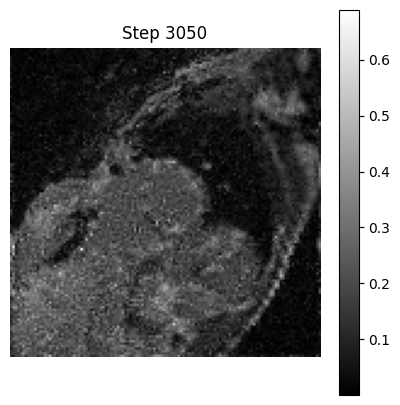

Step  3060, Loss: 3.3000e-01
Step  3070, Loss: 3.2393e-01
Step  3080, Loss: 3.2944e-01
Step  3090, Loss: 3.3213e-01
Step  3100, Loss: 3.2820e-01


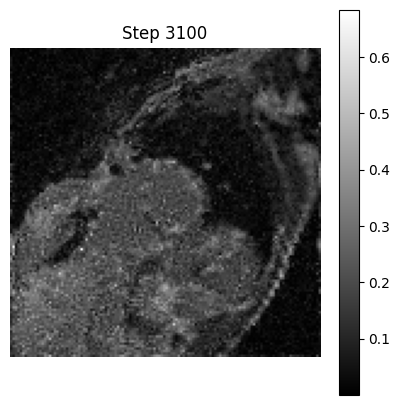

Step  3110, Loss: 3.3365e-01
Step  3120, Loss: 3.3401e-01
Step  3130, Loss: 3.3671e-01
Step  3140, Loss: 3.2772e-01
Step  3150, Loss: 3.2798e-01


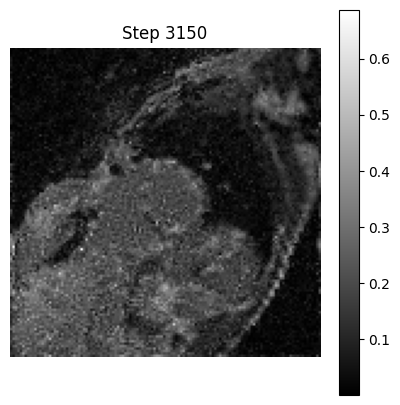

Step  3160, Loss: 3.2834e-01
Step  3170, Loss: 3.4504e-01
Step  3180, Loss: 3.4248e-01
Step  3190, Loss: 3.2974e-01
Step  3200, Loss: 3.3295e-01


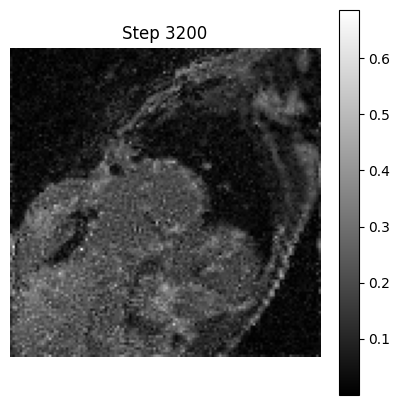

Step  3210, Loss: 3.3867e-01
Step  3220, Loss: 3.3306e-01
Step  3230, Loss: 3.2474e-01
Step  3240, Loss: 3.2388e-01
Step  3250, Loss: 3.2620e-01


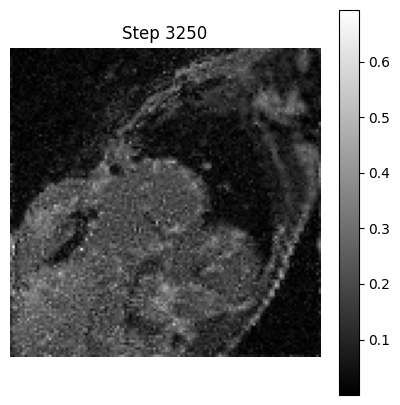

Step  3260, Loss: 3.2668e-01
Step  3270, Loss: 3.3341e-01
Step  3280, Loss: 3.3283e-01
Step  3290, Loss: 3.3102e-01
Step  3300, Loss: 3.3140e-01


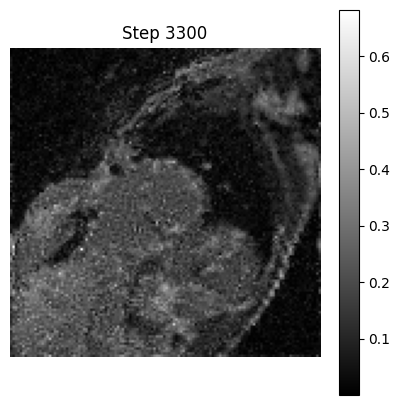

Step  3310, Loss: 3.3166e-01
Step  3320, Loss: 3.2316e-01
Step  3330, Loss: 3.2146e-01
Step  3340, Loss: 3.3102e-01
Step  3350, Loss: 3.2395e-01


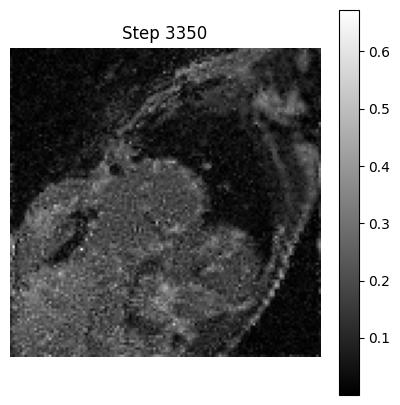

Step  3360, Loss: 3.3298e-01
Step  3370, Loss: 3.3114e-01
Step  3380, Loss: 3.2531e-01
Step  3390, Loss: 3.3031e-01
Step  3400, Loss: 3.3169e-01


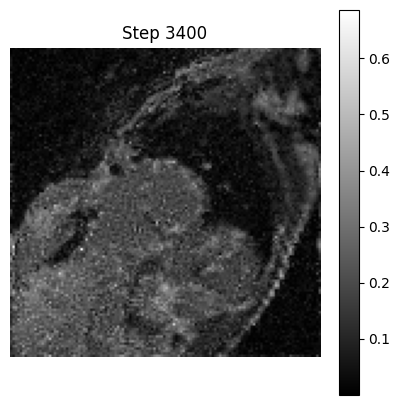

Step  3410, Loss: 3.2794e-01
Step  3420, Loss: 3.3438e-01
Step  3430, Loss: 3.2574e-01
Step  3440, Loss: 3.2657e-01
Step  3450, Loss: 3.2003e-01


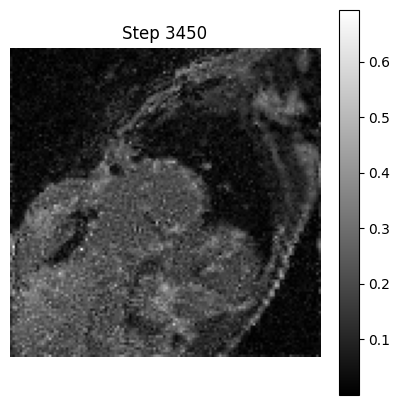

Step  3460, Loss: 3.2180e-01
Step  3470, Loss: 3.2707e-01
Step  3480, Loss: 3.2507e-01
Step  3490, Loss: 3.2829e-01
Step  3500, Loss: 3.3457e-01


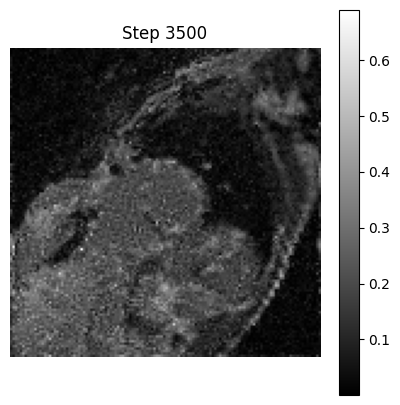

Step  3510, Loss: 3.3351e-01
Step  3520, Loss: 3.2619e-01
Step  3530, Loss: 3.2535e-01
Step  3540, Loss: 3.3074e-01
Step  3550, Loss: 3.3775e-01


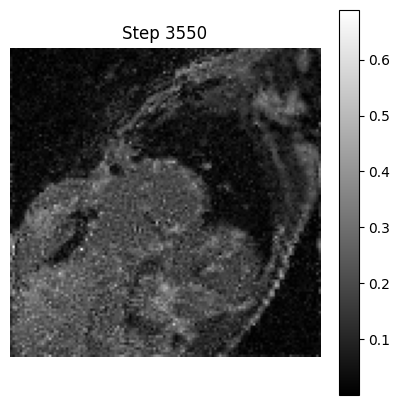

Step  3560, Loss: 3.3014e-01
Step  3570, Loss: 3.2614e-01
Step  3580, Loss: 3.3184e-01
Step  3590, Loss: 3.2395e-01
Step  3600, Loss: 3.2506e-01


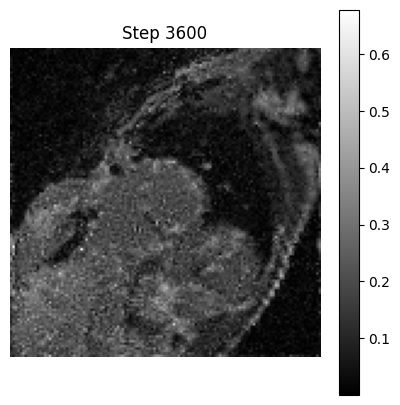

Step  3610, Loss: 3.2896e-01
Step  3620, Loss: 3.2235e-01
Step  3630, Loss: 3.2756e-01
Step  3640, Loss: 3.3576e-01
Step  3650, Loss: 3.3084e-01


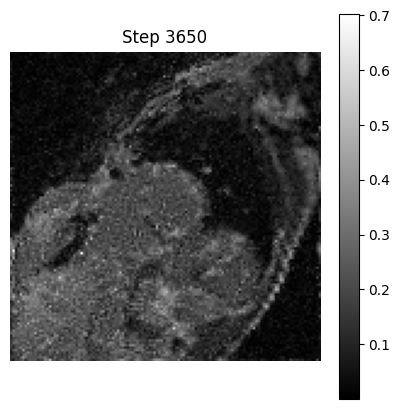

Step  3660, Loss: 3.2782e-01
Step  3670, Loss: 3.3370e-01
Step  3680, Loss: 3.2393e-01
Step  3690, Loss: 3.2360e-01
Step  3700, Loss: 3.3713e-01


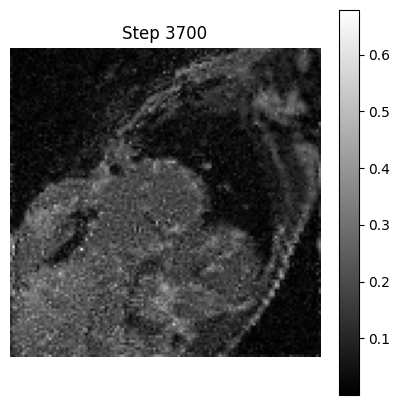

Step  3710, Loss: 3.3061e-01
Step  3720, Loss: 3.2415e-01
Step  3730, Loss: 3.3075e-01
Step  3740, Loss: 3.3540e-01
Step  3750, Loss: 3.2852e-01


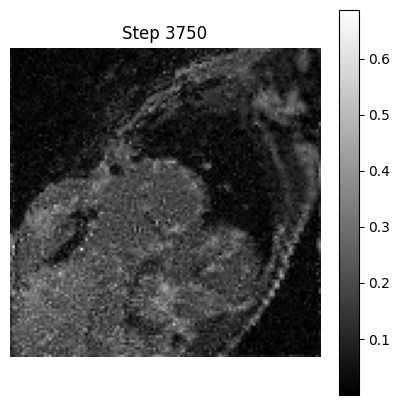

Step  3760, Loss: 3.2668e-01
Step  3770, Loss: 3.2283e-01
Step  3780, Loss: 3.1743e-01
Step  3790, Loss: 3.3059e-01
Step  3800, Loss: 3.1737e-01


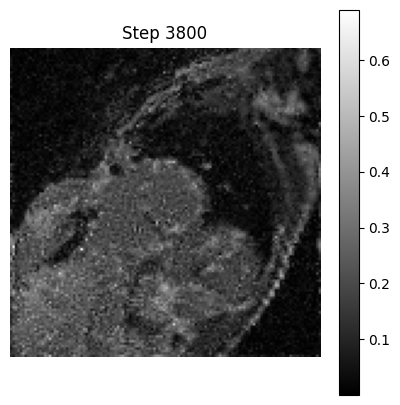

Step  3810, Loss: 3.2798e-01
Step  3820, Loss: 3.2212e-01
Step  3830, Loss: 3.2447e-01
Step  3840, Loss: 3.1856e-01
Step  3850, Loss: 3.1805e-01


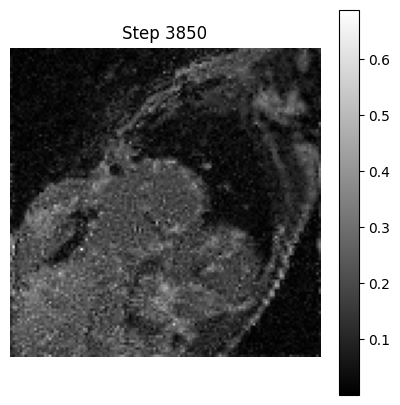

Step  3860, Loss: 3.2461e-01
Step  3870, Loss: 3.2961e-01
Step  3880, Loss: 3.1694e-01
Step  3890, Loss: 3.3419e-01
Step  3900, Loss: 3.3112e-01


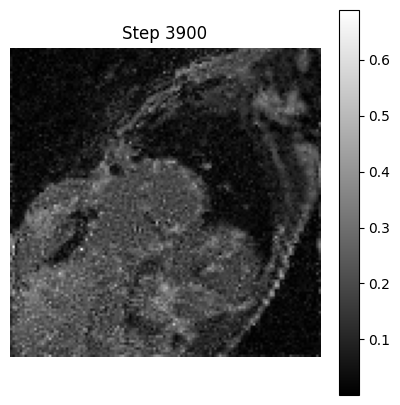

Step  3910, Loss: 3.3402e-01
Step  3920, Loss: 3.2884e-01
Step  3930, Loss: 3.2079e-01
Step  3940, Loss: 3.3213e-01
Step  3950, Loss: 3.1837e-01


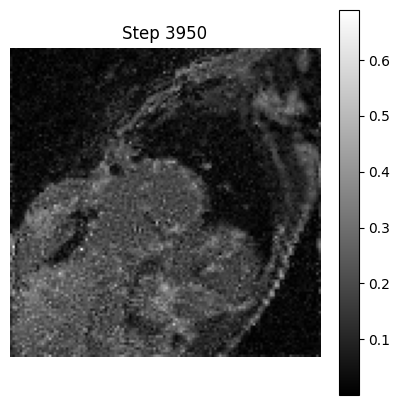

Step  3960, Loss: 3.2466e-01
Step  3970, Loss: 3.3895e-01
Step  3980, Loss: 3.2575e-01
Step  3990, Loss: 3.3063e-01
Step  4000, Loss: 3.3108e-01


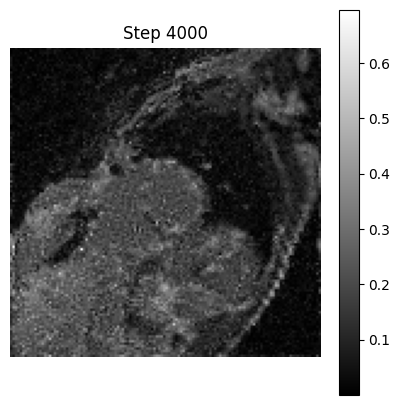

Step  4010, Loss: 3.3521e-01
Step  4020, Loss: 3.1520e-01
Step  4030, Loss: 3.2415e-01
Step  4040, Loss: 3.2533e-01
Step  4050, Loss: 3.1867e-01


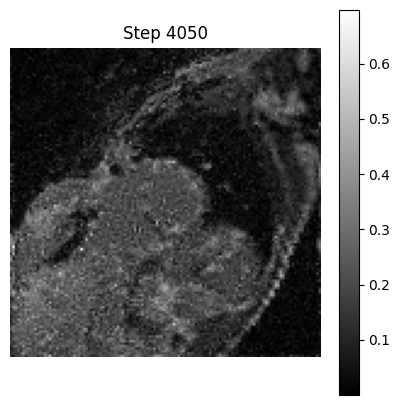

Step  4060, Loss: 3.1828e-01
Step  4070, Loss: 3.2380e-01
Step  4080, Loss: 3.2124e-01
Step  4090, Loss: 3.1765e-01
Step  4100, Loss: 3.2729e-01


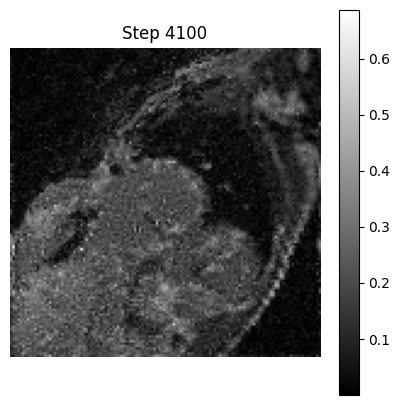

Step  4110, Loss: 3.2110e-01
Step  4120, Loss: 3.2028e-01
Step  4130, Loss: 3.2018e-01
Step  4140, Loss: 3.2687e-01
Step  4150, Loss: 3.1999e-01


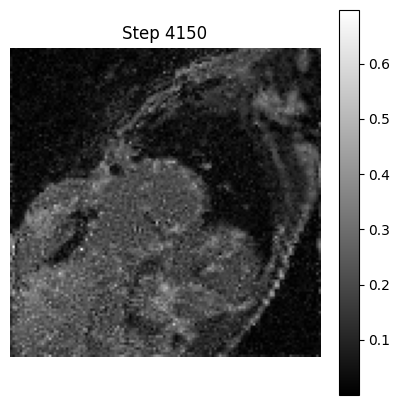

Step  4160, Loss: 3.3131e-01
Step  4170, Loss: 3.2629e-01
Step  4180, Loss: 3.2698e-01
Step  4190, Loss: 3.2821e-01
Step  4200, Loss: 3.1610e-01


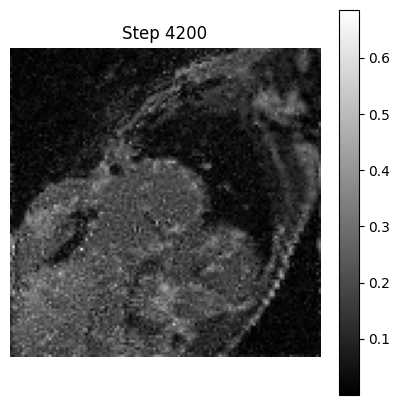

Step  4210, Loss: 3.2254e-01
Step  4220, Loss: 3.1990e-01
Step  4230, Loss: 3.1875e-01
Step  4240, Loss: 3.3081e-01
Step  4250, Loss: 3.1967e-01


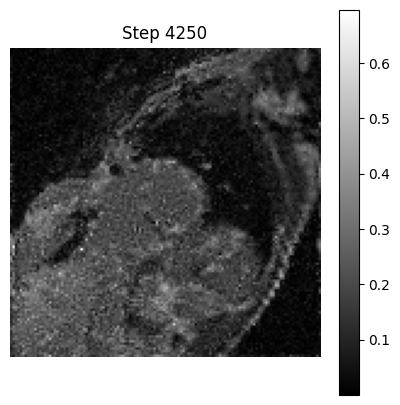

Step  4260, Loss: 3.2528e-01
Step  4270, Loss: 3.1681e-01
Step  4280, Loss: 3.3567e-01
Step  4290, Loss: 3.2933e-01
Step  4300, Loss: 3.2714e-01


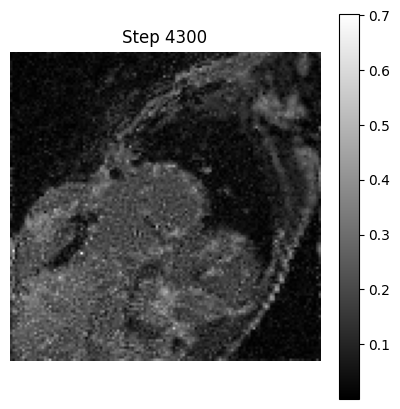

Step  4310, Loss: 3.1473e-01
Step  4320, Loss: 3.2338e-01
Step  4330, Loss: 3.2331e-01
Step  4340, Loss: 3.2486e-01
Step  4350, Loss: 3.2726e-01


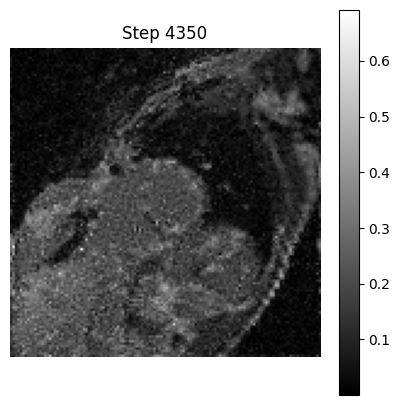

Step  4360, Loss: 3.2250e-01
Step  4370, Loss: 3.2031e-01
Step  4380, Loss: 3.2146e-01
Step  4390, Loss: 3.3505e-01
Step  4400, Loss: 3.3285e-01


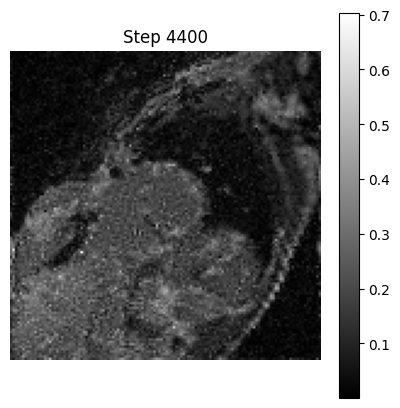

Step  4410, Loss: 3.2725e-01
Step  4420, Loss: 3.1371e-01
Step  4430, Loss: 3.3042e-01
Step  4440, Loss: 3.3972e-01
Step  4450, Loss: 3.3420e-01


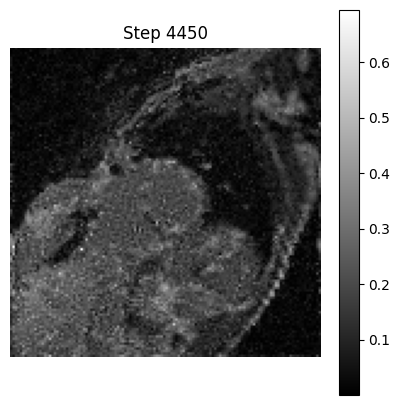

Step  4460, Loss: 3.1252e-01
Step  4470, Loss: 3.2138e-01
Step  4480, Loss: 3.2822e-01
Step  4490, Loss: 3.1285e-01
Step  4500, Loss: 3.2247e-01


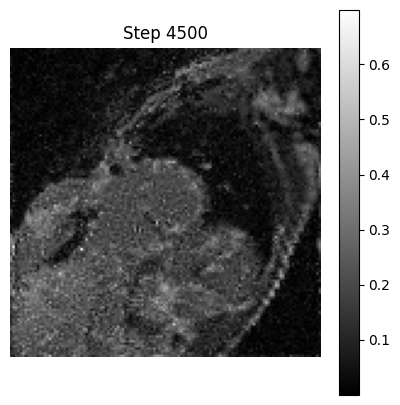

Step  4510, Loss: 3.1657e-01
Step  4520, Loss: 3.1987e-01
Step  4530, Loss: 3.2165e-01
Step  4540, Loss: 3.1533e-01
Step  4550, Loss: 3.2469e-01


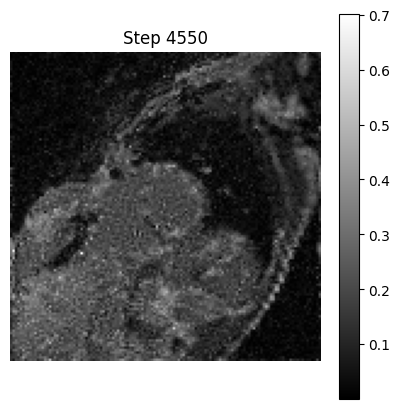

Step  4560, Loss: 3.1443e-01
Step  4570, Loss: 3.2055e-01
Step  4580, Loss: 3.1659e-01
Step  4590, Loss: 3.2196e-01
Step  4600, Loss: 3.2965e-01


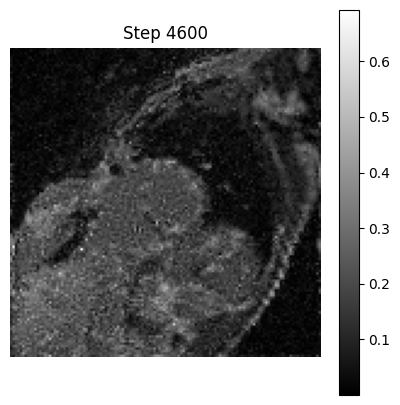

Step  4610, Loss: 3.3373e-01
Step  4620, Loss: 3.1426e-01
Step  4630, Loss: 3.1671e-01
Step  4640, Loss: 3.2689e-01
Step  4650, Loss: 3.1470e-01


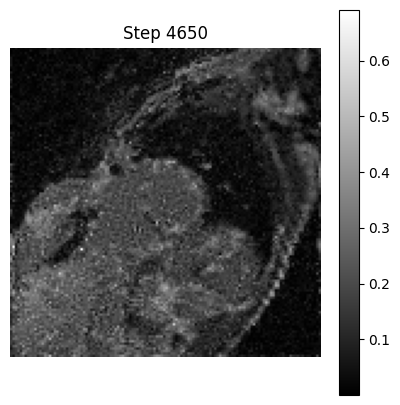

Step  4660, Loss: 3.3154e-01
Step  4670, Loss: 3.2174e-01
Step  4680, Loss: 3.2165e-01
Step  4690, Loss: 3.2249e-01
Step  4700, Loss: 3.2901e-01


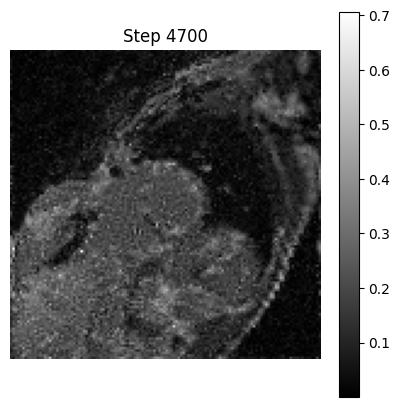

Step  4710, Loss: 3.2540e-01
Step  4720, Loss: 3.1609e-01
Step  4730, Loss: 3.1981e-01
Step  4740, Loss: 3.2347e-01
Step  4750, Loss: 3.2700e-01


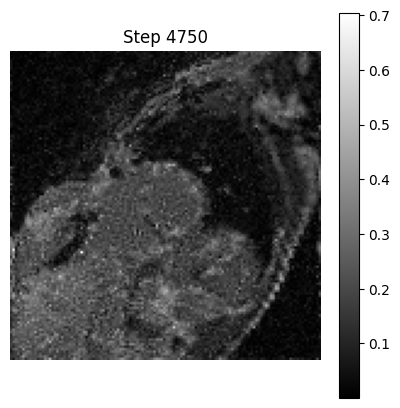

Step  4760, Loss: 3.2233e-01
Step  4770, Loss: 3.1543e-01
Step  4780, Loss: 3.2133e-01
Step  4790, Loss: 3.1897e-01
Step  4800, Loss: 3.1736e-01


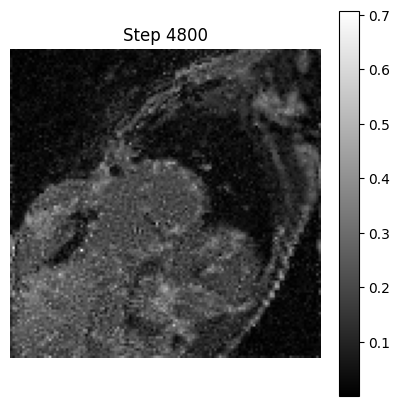

Step  4810, Loss: 3.1641e-01
Step  4820, Loss: 3.1777e-01
Step  4830, Loss: 3.1603e-01
Step  4840, Loss: 3.2194e-01
Step  4850, Loss: 3.1551e-01


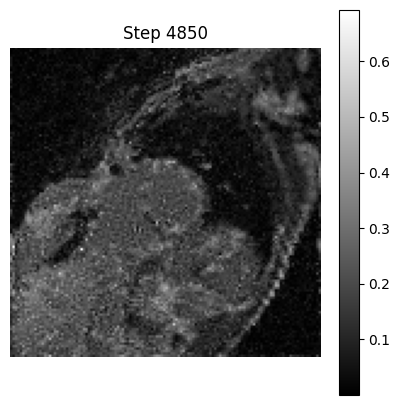

Step  4860, Loss: 3.1954e-01
Step  4870, Loss: 3.1649e-01
Step  4880, Loss: 3.1983e-01
Step  4890, Loss: 3.2849e-01
Step  4900, Loss: 3.2128e-01


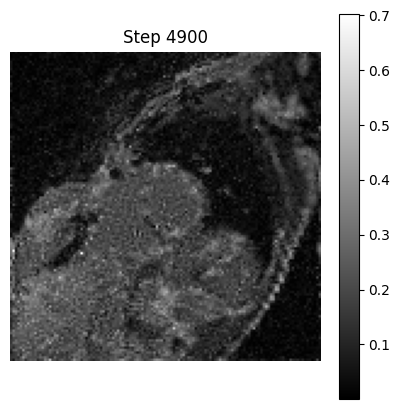

Step  4910, Loss: 3.1529e-01
Step  4920, Loss: 3.2013e-01
Step  4930, Loss: 3.2276e-01
Step  4940, Loss: 3.1647e-01
Step  4950, Loss: 3.1665e-01


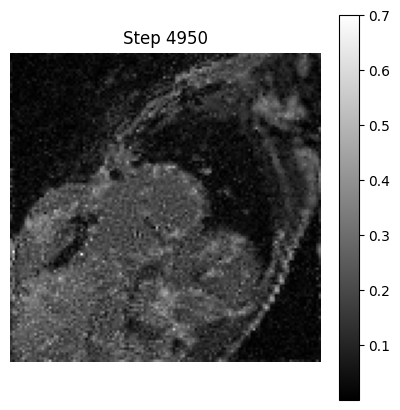

Step  4960, Loss: 3.1364e-01
Step  4970, Loss: 3.1608e-01
Step  4980, Loss: 3.1862e-01
Step  4990, Loss: 3.1460e-01
Step  5000, Loss: 3.1074e-01


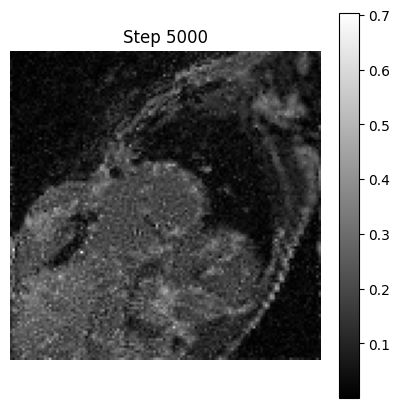

Step  5010, Loss: 3.2525e-01
Step  5020, Loss: 3.3100e-01
Step  5030, Loss: 3.2331e-01
Step  5040, Loss: 3.1556e-01
Step  5050, Loss: 3.1736e-01


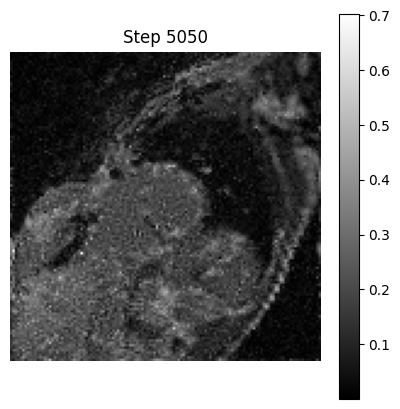

Step  5060, Loss: 3.2131e-01
Step  5070, Loss: 3.1807e-01
Step  5080, Loss: 3.2067e-01
Step  5090, Loss: 3.2531e-01
Step  5100, Loss: 3.2191e-01


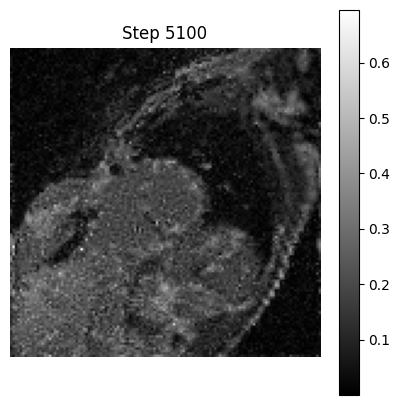

Step  5110, Loss: 3.1614e-01
Step  5120, Loss: 3.1179e-01
Step  5130, Loss: 3.2663e-01
Step  5140, Loss: 3.2311e-01
Step  5150, Loss: 3.1784e-01


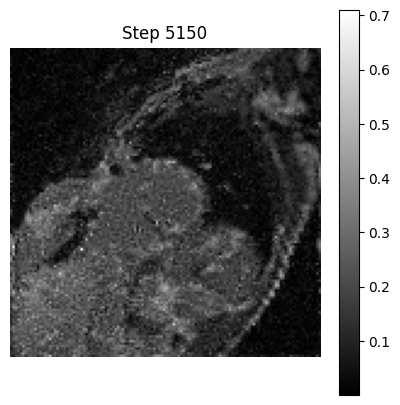

Step  5160, Loss: 3.1603e-01
Step  5170, Loss: 3.1776e-01
Step  5180, Loss: 3.1414e-01
Step  5190, Loss: 3.2286e-01
Step  5200, Loss: 3.1288e-01


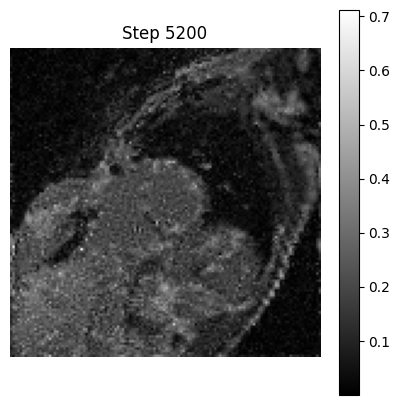

Step  5210, Loss: 3.2422e-01
Step  5220, Loss: 3.1382e-01
Step  5230, Loss: 3.2313e-01
Step  5240, Loss: 3.1609e-01
Step  5250, Loss: 3.0969e-01


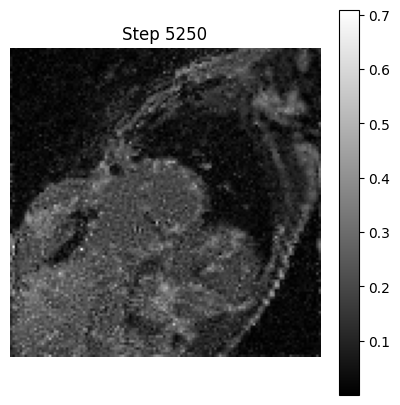

Step  5260, Loss: 3.1907e-01
Step  5270, Loss: 3.1240e-01
Step  5280, Loss: 3.2252e-01
Step  5290, Loss: 3.1424e-01
Step  5300, Loss: 3.1220e-01


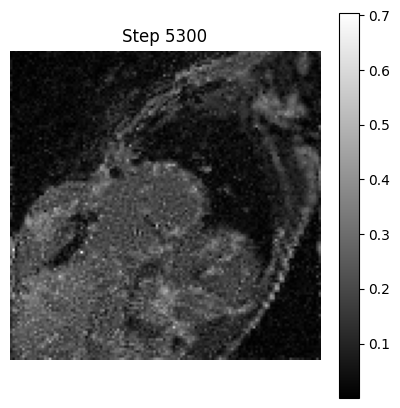

Step  5310, Loss: 3.1653e-01
Step  5320, Loss: 3.1814e-01
Step  5330, Loss: 3.1527e-01
Step  5340, Loss: 3.2379e-01
Step  5350, Loss: 3.2258e-01


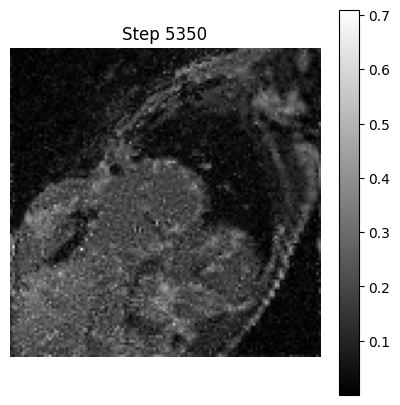

Step  5360, Loss: 3.2004e-01
Step  5370, Loss: 3.1058e-01
Step  5380, Loss: 3.2250e-01
Step  5390, Loss: 3.1527e-01
Step  5400, Loss: 3.1913e-01


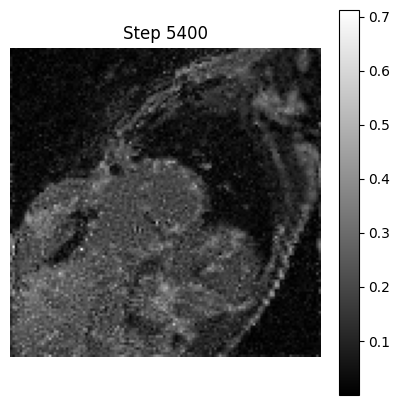

Step  5410, Loss: 3.1304e-01
Step  5420, Loss: 3.2313e-01
Step  5430, Loss: 3.1729e-01
Step  5440, Loss: 3.1088e-01
Step  5450, Loss: 3.1220e-01


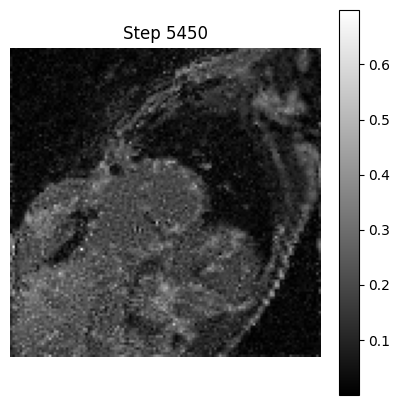

Step  5460, Loss: 3.2359e-01
Step  5470, Loss: 3.1790e-01
Step  5480, Loss: 3.2334e-01
Step  5490, Loss: 3.2132e-01
Step  5500, Loss: 3.1763e-01


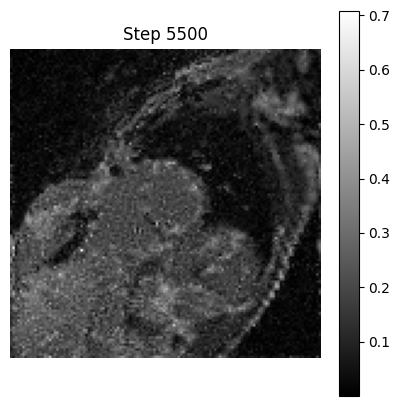

Step  5510, Loss: 3.1895e-01
Step  5520, Loss: 3.2291e-01
Step  5530, Loss: 3.1784e-01
Step  5540, Loss: 3.1317e-01
Step  5550, Loss: 3.1698e-01


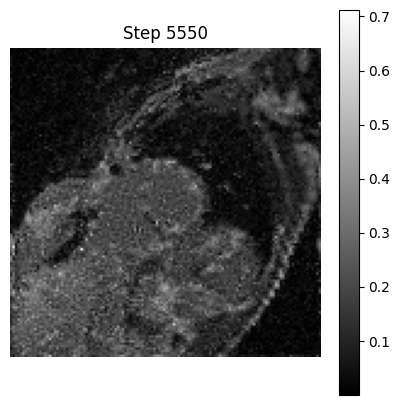

Step  5560, Loss: 3.3376e-01
Step  5570, Loss: 3.2398e-01
Step  5580, Loss: 3.1457e-01
Step  5590, Loss: 3.1374e-01
Step  5600, Loss: 3.2205e-01


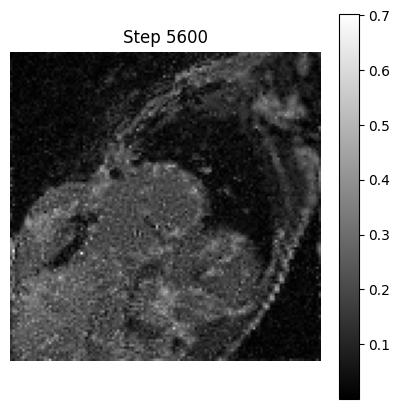

Step  5610, Loss: 3.1149e-01
Step  5620, Loss: 3.2673e-01
Step  5630, Loss: 3.2211e-01
Step  5640, Loss: 3.0954e-01
Step  5650, Loss: 3.1928e-01


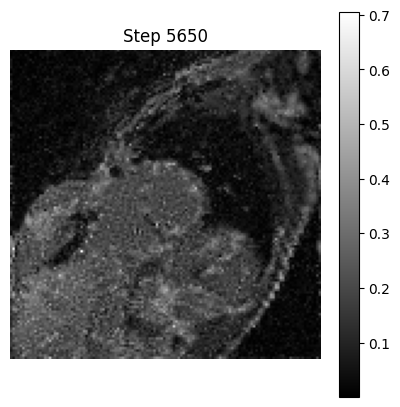

Step  5660, Loss: 3.1462e-01
Step  5670, Loss: 3.2086e-01
Step  5680, Loss: 3.1453e-01
Step  5690, Loss: 3.1374e-01
Step  5700, Loss: 3.1394e-01


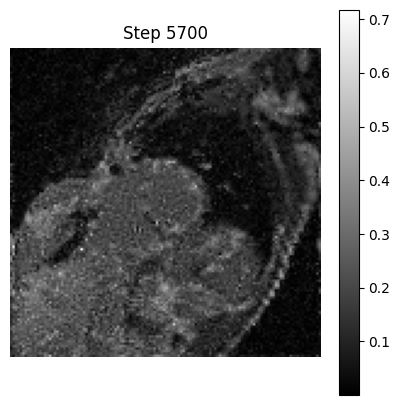

Step  5710, Loss: 3.2518e-01
Step  5720, Loss: 3.3052e-01
Step  5730, Loss: 3.2468e-01
Step  5740, Loss: 3.1289e-01
Step  5750, Loss: 3.1415e-01


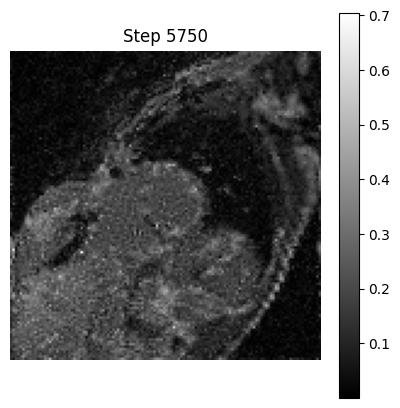

Step  5760, Loss: 3.2039e-01
Step  5770, Loss: 3.2214e-01
Step  5780, Loss: 3.1210e-01
Step  5790, Loss: 3.1048e-01
Step  5800, Loss: 3.1776e-01


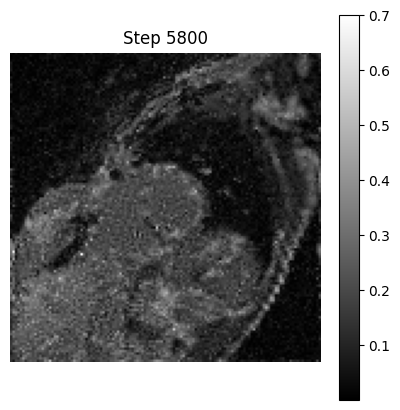

Step  5810, Loss: 3.1935e-01
Step  5820, Loss: 3.2096e-01
Step  5830, Loss: 3.1672e-01
Step  5840, Loss: 3.1755e-01
Step  5850, Loss: 3.2191e-01


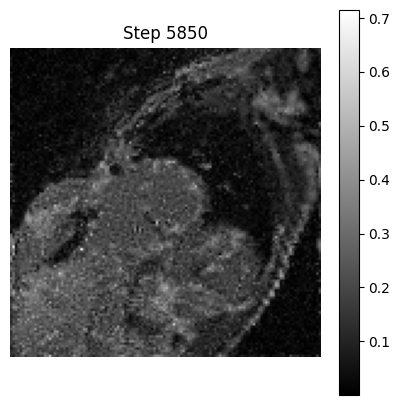

Step  5860, Loss: 3.2154e-01
Step  5870, Loss: 3.1286e-01
Step  5880, Loss: 3.1923e-01
Step  5890, Loss: 3.1326e-01
Step  5900, Loss: 3.1449e-01


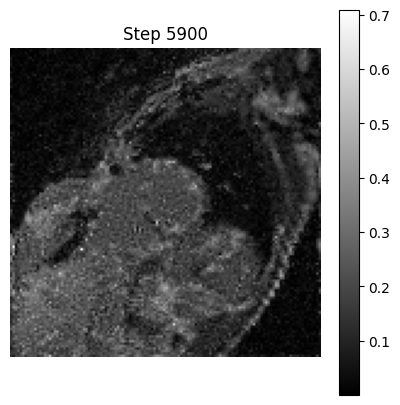

Step  5910, Loss: 3.2308e-01
Step  5920, Loss: 3.1575e-01
Step  5930, Loss: 3.2325e-01
Step  5940, Loss: 3.1164e-01
Step  5950, Loss: 3.1257e-01


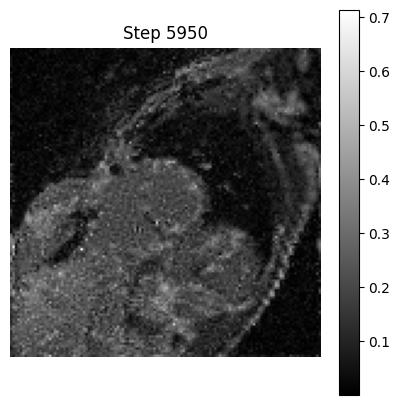

Step  5960, Loss: 3.1963e-01
Step  5970, Loss: 3.1215e-01
Step  5980, Loss: 3.2995e-01
Step  5990, Loss: 3.2382e-01
Step  6000, Loss: 3.1182e-01


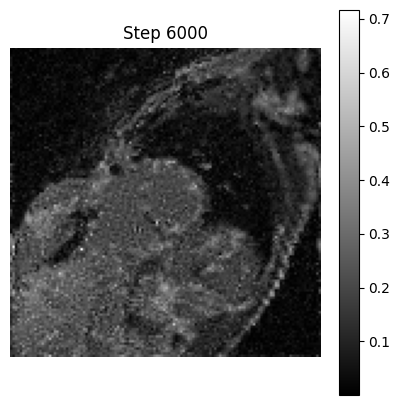

Step  6010, Loss: 3.1342e-01
Step  6020, Loss: 3.1914e-01
Step  6030, Loss: 3.1157e-01
Step  6040, Loss: 3.0936e-01
Step  6050, Loss: 3.0789e-01


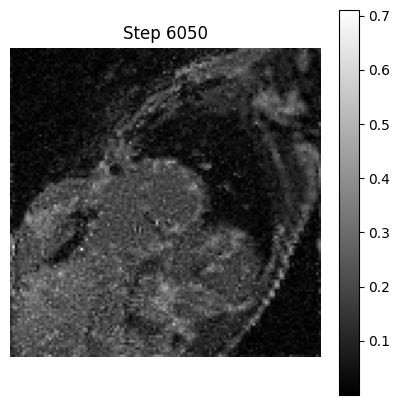

Step  6060, Loss: 3.0736e-01
Step  6070, Loss: 3.1454e-01
Step  6080, Loss: 3.1300e-01
Step  6090, Loss: 3.2029e-01
Step  6100, Loss: 3.1541e-01


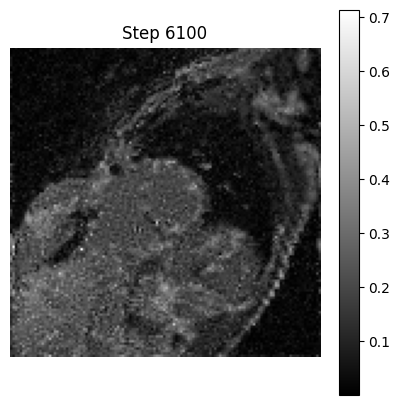

Step  6110, Loss: 3.2176e-01
Step  6120, Loss: 3.2415e-01
Step  6130, Loss: 3.1918e-01
Step  6140, Loss: 3.1685e-01
Step  6150, Loss: 3.1885e-01


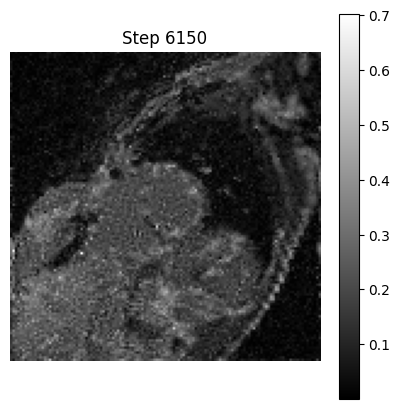

Step  6160, Loss: 3.1095e-01
Step  6170, Loss: 3.1825e-01
Step  6180, Loss: 3.1518e-01
Step  6190, Loss: 3.1269e-01
Step  6200, Loss: 3.1226e-01


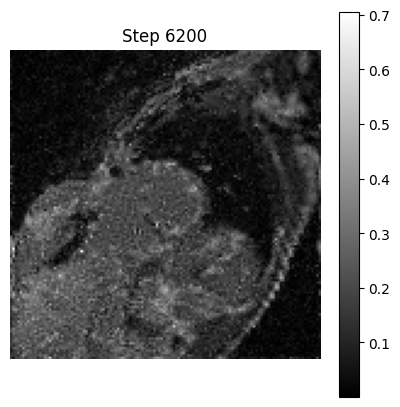

Step  6210, Loss: 3.1569e-01
Step  6220, Loss: 3.0766e-01
Step  6230, Loss: 3.1180e-01
Step  6240, Loss: 3.1641e-01
Step  6250, Loss: 3.1360e-01


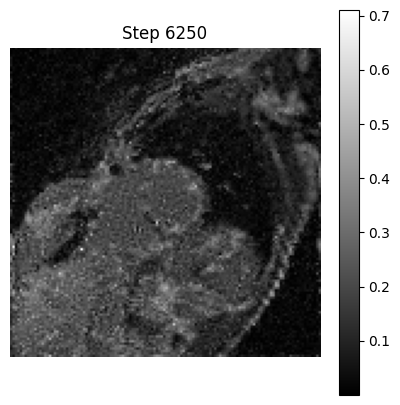

Step  6260, Loss: 3.0936e-01
Step  6270, Loss: 3.1910e-01
Step  6280, Loss: 3.1028e-01
Step  6290, Loss: 3.0809e-01
Step  6300, Loss: 3.1845e-01


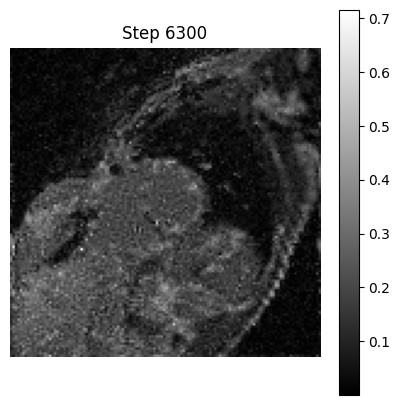

Step  6310, Loss: 3.1475e-01
Step  6320, Loss: 3.1947e-01
Step  6330, Loss: 3.1789e-01
Step  6340, Loss: 3.1427e-01
Step  6350, Loss: 3.1324e-01


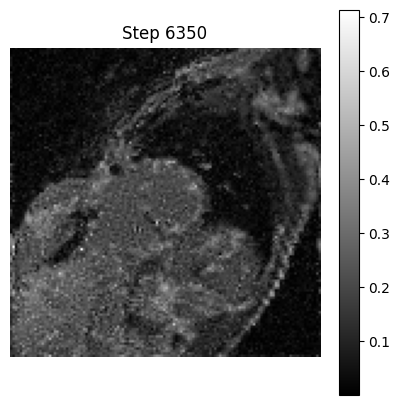

Step  6360, Loss: 3.1064e-01
Step  6370, Loss: 3.1082e-01
Step  6380, Loss: 3.0722e-01
Step  6390, Loss: 3.1589e-01
Step  6400, Loss: 3.1400e-01


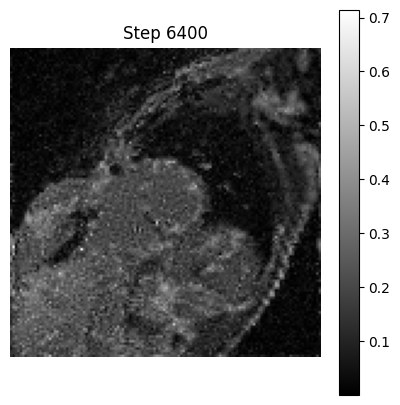

Step  6410, Loss: 3.1731e-01
Step  6420, Loss: 3.1644e-01
Step  6430, Loss: 3.0911e-01
Step  6440, Loss: 3.1956e-01
Step  6450, Loss: 3.1383e-01


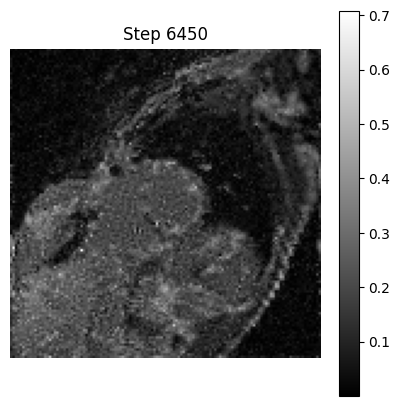

Step  6460, Loss: 3.1692e-01
Step  6470, Loss: 3.1663e-01
Step  6480, Loss: 3.1042e-01
Step  6490, Loss: 3.2436e-01
Step  6500, Loss: 3.2331e-01


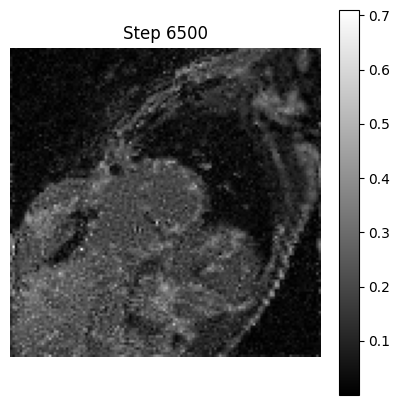

Step  6510, Loss: 3.1393e-01
Step  6520, Loss: 3.1192e-01
Step  6530, Loss: 3.1189e-01
Step  6540, Loss: 3.1242e-01
Step  6550, Loss: 3.1193e-01


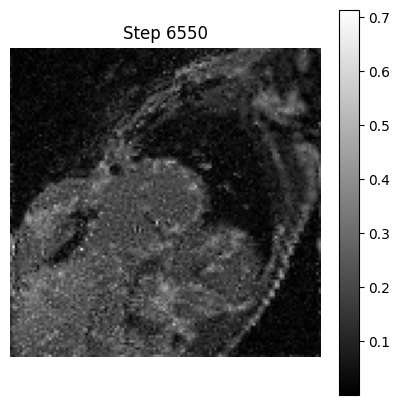

Step  6560, Loss: 3.2234e-01
Step  6570, Loss: 3.1511e-01
Step  6580, Loss: 3.1473e-01
Step  6590, Loss: 3.1212e-01
Step  6600, Loss: 3.1007e-01


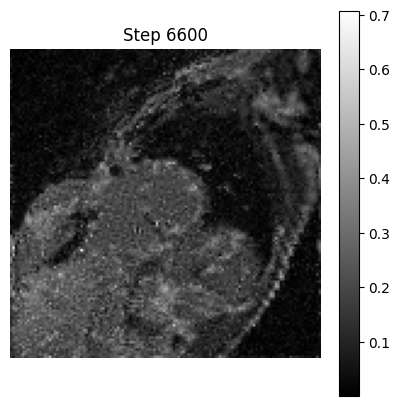

Step  6610, Loss: 3.1506e-01
Step  6620, Loss: 3.1419e-01
Step  6630, Loss: 3.1330e-01
Step  6640, Loss: 3.1538e-01
Step  6650, Loss: 3.1147e-01


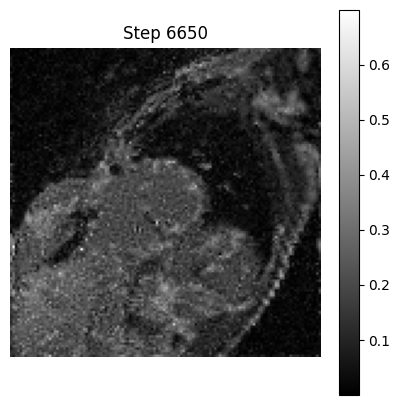

Step  6660, Loss: 3.1346e-01
Step  6670, Loss: 3.2636e-01
Step  6680, Loss: 3.1361e-01
Step  6690, Loss: 3.1415e-01
Step  6700, Loss: 3.1490e-01


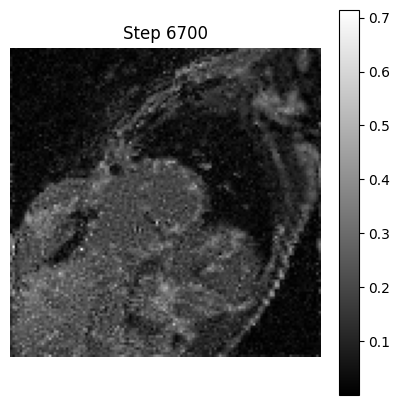

Step  6710, Loss: 3.1517e-01
Step  6720, Loss: 3.2195e-01
Step  6730, Loss: 3.2216e-01
Step  6740, Loss: 3.1822e-01
Step  6750, Loss: 3.1486e-01


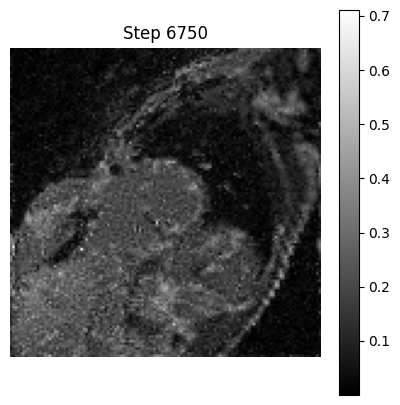

Step  6760, Loss: 3.1147e-01
Step  6770, Loss: 3.2408e-01
Step  6780, Loss: 3.1885e-01
Step  6790, Loss: 3.2026e-01
Step  6800, Loss: 3.1217e-01


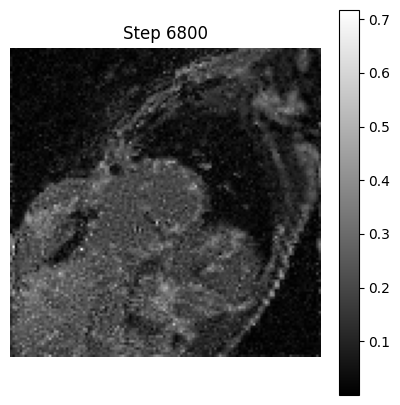

Step  6810, Loss: 3.1343e-01
Step  6820, Loss: 3.1502e-01
Step  6830, Loss: 3.1987e-01
Step  6840, Loss: 3.1906e-01
Step  6850, Loss: 3.1350e-01


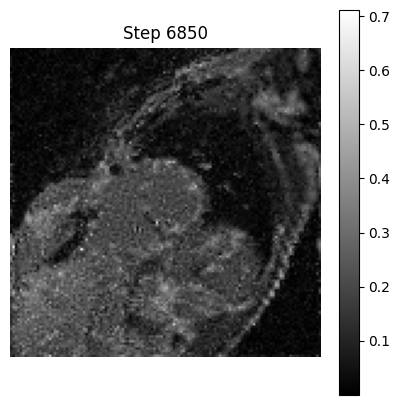

Step  6860, Loss: 3.1690e-01
Step  6870, Loss: 3.1512e-01
Step  6880, Loss: 3.1475e-01
Step  6890, Loss: 3.0463e-01
Step  6900, Loss: 3.2113e-01


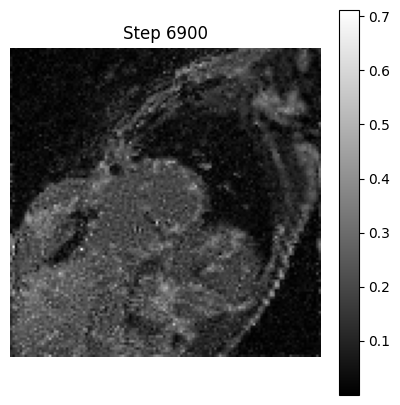

Step  6910, Loss: 3.2148e-01
Step  6920, Loss: 3.2015e-01
Step  6930, Loss: 3.1962e-01
Step  6940, Loss: 3.1280e-01
Step  6950, Loss: 3.1488e-01


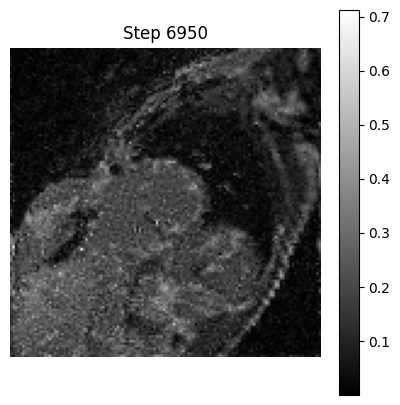

Step  6960, Loss: 3.0980e-01
Step  6970, Loss: 3.0951e-01
Step  6980, Loss: 3.2007e-01
Step  6990, Loss: 3.2076e-01
Step  7000, Loss: 3.2345e-01


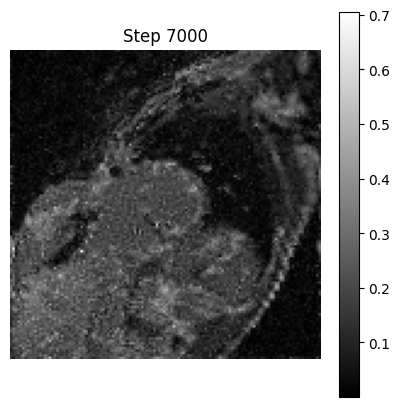

Step  7010, Loss: 3.2314e-01
Step  7020, Loss: 3.0961e-01
Step  7030, Loss: 3.1568e-01
Step  7040, Loss: 3.0704e-01
Step  7050, Loss: 3.0624e-01


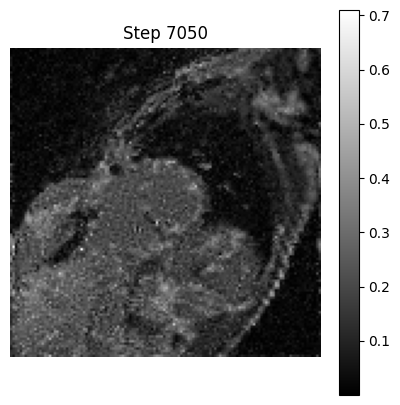

Step  7060, Loss: 3.2315e-01
Step  7070, Loss: 3.2485e-01
Step  7080, Loss: 3.1720e-01
Step  7090, Loss: 3.0549e-01
Step  7100, Loss: 3.1659e-01


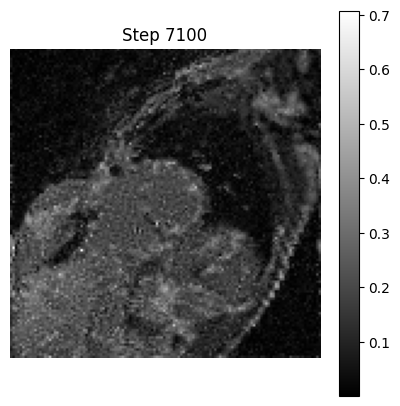

Step  7110, Loss: 3.1154e-01
Step  7120, Loss: 3.1359e-01
Step  7130, Loss: 3.1533e-01
Step  7140, Loss: 3.1125e-01
Step  7150, Loss: 3.0886e-01


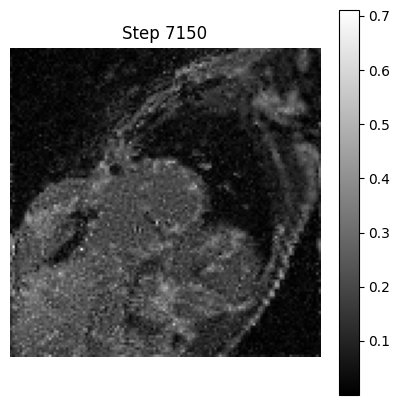

Step  7160, Loss: 3.1510e-01
Step  7170, Loss: 3.1585e-01
Step  7180, Loss: 3.1546e-01
Step  7190, Loss: 3.0816e-01
Step  7200, Loss: 3.1556e-01


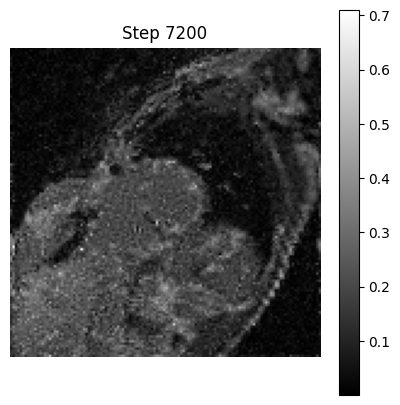

Step  7210, Loss: 3.1407e-01
Step  7220, Loss: 3.1181e-01
Step  7230, Loss: 3.1187e-01
Step  7240, Loss: 3.0783e-01
Step  7250, Loss: 3.1648e-01


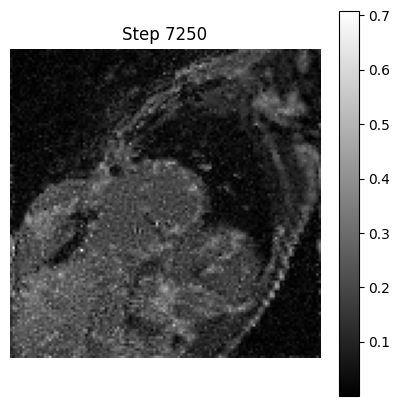

Step  7260, Loss: 3.2883e-01
Step  7270, Loss: 3.1696e-01
Step  7280, Loss: 3.1712e-01
Step  7290, Loss: 3.1365e-01
Step  7300, Loss: 3.0826e-01


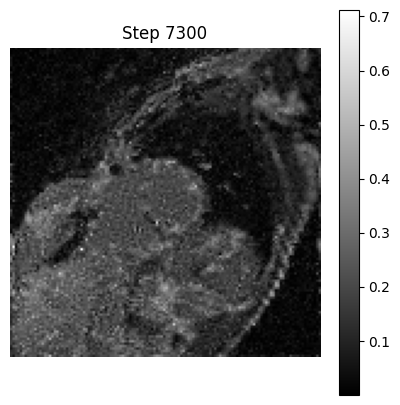

Step  7310, Loss: 3.0917e-01
Step  7320, Loss: 3.0935e-01
Step  7330, Loss: 3.1111e-01
Step  7340, Loss: 3.1172e-01
Step  7350, Loss: 3.1084e-01


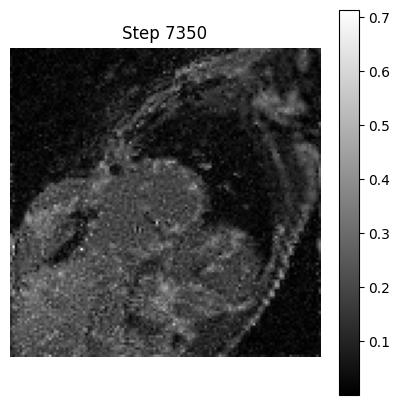

Step  7360, Loss: 3.2338e-01
Step  7370, Loss: 3.1350e-01
Step  7380, Loss: 3.1940e-01
Step  7390, Loss: 3.1259e-01
Step  7400, Loss: 3.0772e-01


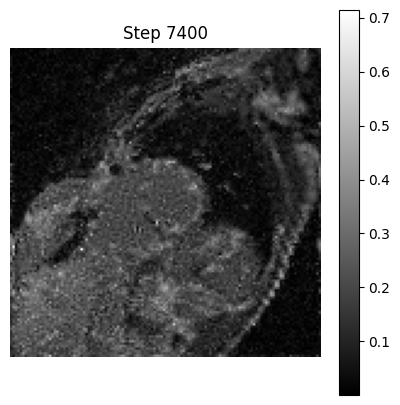

Step  7410, Loss: 3.0658e-01
Step  7420, Loss: 3.0821e-01
Step  7430, Loss: 3.1982e-01
Step  7440, Loss: 3.1332e-01
Step  7450, Loss: 3.1429e-01


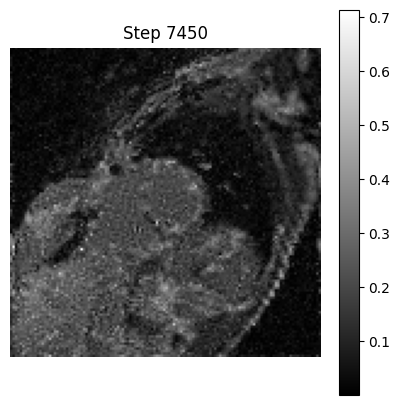

Step  7460, Loss: 3.0802e-01
Step  7470, Loss: 3.0868e-01
Step  7480, Loss: 3.1072e-01
Step  7490, Loss: 3.1082e-01


In [55]:
# ===============================================================
# 7. Training loop
# ===============================================================
n_steps = 7_500
losses = []


for step in range(n_steps):
    loss, grads = nnx.value_and_grad(loss_fn)(model)
    optimizer.update(model, grads)
    losses.append(loss)

    if step % 10 == 0:
        print(f"Step {step:5d}, Loss: {float(loss):.4e}")

    if step % 50 == 0:
        y = model(z_hr, training=False)
        I_hr_pred = y[..., 0] + 1j * y[..., 1]
        plt.figure(figsize=(5,5))
        plt.imshow(np.abs(I_hr_pred[0,:,:]), cmap='gray')
        plt.title(f"Step {step}")
        plt.colorbar()
        plt.axis('off')
        plt.show()